In [1]:
import math, random, os, pickle
import pandas as pd
import numpy as np
import matplotlib.pyplot as plt
import seaborn as sns
import warnings
import torch
import torch.nn as nn
import torch.nn.functional as F
from torch.utils.data import Dataset, DataLoader
from sklearn.model_selection import train_test_split
import math
import time
from time import perf_counter
from datetime import timedelta
from contextlib import nullcontext
import torch.optim as optim
from dataclasses import dataclass, asdict
from tqdm import tqdm
from tqdm.auto import tqdm
import torch.multiprocessing as mp
from sklearn.metrics import confusion_matrix
from sklearn.metrics import accuracy_score, f1_score, precision_score, recall_score, confusion_matrix, precision_recall_curve, average_precision_score

import warnings
warnings.filterwarnings('ignore')

plt.rcParams['figure.figsize'] = (10,6)
plt.rcParams['figure.dpi'] = 300

DEVICE = 'cuda' if torch.cuda.is_available() else 'cpu'

C:\Users\Suraj\anaconda3\envs\Dissertation\Lib\site-packages\tqdm\auto.py:21: TqdmWarning: IProgress not found. Please update jupyter and ipywidgets. See https://ipywidgets.readthedocs.io/en/stable/user_install.html
  from .autonotebook import tqdm as notebook_tqdm


In [2]:
# Load Dataset

base_path = '...\Dataset'

file_map = {
    'plasticc_train_lightcurves': 'train',
    'plasticc_train_metadata': 'train_metadata'
}

# Load into global namespace to use variable names directly

for folder, var_name in file_map.items():
    folder_path = os.path.join(base_path, folder)
    csv_file = [f for f in os.listdir(folder_path) if f.endswith('.csv')][0]
    file_path = os.path.join(folder_path, csv_file)
    globals()[var_name] = pd.read_csv(file_path)
    print(f"Loaded: {var_name}")

Loaded: train
Loaded: train_metadata


In [3]:
# Transform mjd into relative time (days since first observation per object)
train['time'] = train.groupby('object_id')['mjd'].transform(lambda x: x - x.min())
train.drop(columns='mjd', inplace=True)
train

,object_id,passband,flux,flux_err,detected_bool,time
0,615,2,-544.810303,3.622952,1,0.0000
1,615,1,-816.434326,5.553370,1,0.0077
2,615,3,-471.385529,3.801213,1,0.0154
3,615,4,-388.984985,11.395031,1,0.0221
4,615,2,-681.858887,4.041204,1,1.9841
...,...,...,...,...,...,...
1421700,130779836,4,-39.881969,46.477093,0,845.5708
1421701,130779836,1,14.894439,18.947685,0,849.6329
1421702,130779836,5,30.593130,50.695290,0,860.6095
1421703,130779836,4,-23.471439,44.819859,0,875.5844


In [4]:
# ===========================================
# Neural SDDE (Light-curves only) for PLAsTiCC
# + STRATIFIED 75/15/15 split (object-level) using train_metadata.target
# + Caching of precomputed bundles to disk
# + Train/Val loss history and plots
# ===========================================

# ---- Imports & setup ----
import os, math, random, pickle, json, hashlib
from time import perf_counter
from datetime import timedelta
from pathlib import Path

import numpy as np
import pandas as pd
import matplotlib.pyplot as plt

import torch, torch.multiprocessing as mp
import torch.nn as nn
from torch.utils.data import Dataset, DataLoader
from tqdm.auto import tqdm
from sklearn.model_selection import train_test_split

# Reproducibility
SEED = 42
random.seed(SEED); np.random.seed(SEED); torch.manual_seed(SEED)
torch.cuda.manual_seed_all(SEED)

# ---- Safer multiprocessing on Windows/Notebooks ----
try:
    mp.set_start_method('spawn', force=True)
except RuntimeError:
    pass

# ---------------- CONFIG ----------------
PASSBANDS     = [0,1,2,3,4,5]
NUM_BANDS     = 6
BAND_NAMES    = ['u','g','r','i','z','y']

# Horizon / solver
DAYS  = 100         # daily grid length
DT    = 1.0
TAU   = 14.0        # delay in days (used as steps via TAU/DT)

# Model size / regularization (tuned for RTX 3050)
DZ       = 12
HID      = 32
DROPOUT  = 0.10

# Training (fp32 or AMP)
LR       = 8e-4
WD       = 1e-4
EPOCHS   = 30
BATCH    = 64       # 128 may OOM on 3050; start with 64
NUM_WORKERS = 0     # Windows/Notebook-safe; set >0 on Linux servers
PERSISTENT_WORKERS = False
USE_AMP  = True     # 3050 benefits from AMP; disable if unstable

# Diffusion schedule
WARMUP_EPOCHS = 8
DIFF_MAX      = 0.25

# Reconstruction loss weighting
ERR_FLOOR   = 0.05
WEIGHT_CAP  = 1e3
P_WEIGHT    = 1.5
EPS         = 1e-8

# Smoothness penalty (decoded curves)
LAMBDA_SMOOTH = 1e-3

DEVICE   = 'cuda' if torch.cuda.is_available() else 'cpu'
torch.backends.cudnn.benchmark = True
if hasattr(torch, 'set_float32_matmul_precision'):
    torch.set_float32_matmul_precision('high')

# ---------------- INPUT SAFETY NET ----------------
# Expect DataFrames `train` and `train_metadata` to be present
if 'train' not in globals():
    raise RuntimeError("Expected DataFrame `train` with PLAsTiCC light curves already loaded.")

if 'train_metadata' not in globals():
    raise RuntimeError("Expected DataFrame `train_metadata` with at least ['object_id','target'].")

# Ensure 'time' exists
if 'time' not in train.columns and 'mjd' in train.columns:
    train['time'] = train.groupby('object_id')['mjd'].transform(lambda x: x - x.min())
    if 'mjd' in train.columns:
        train.drop(columns='mjd', inplace=True)

# Keep only what we need from lightcurves
REQUIRED = ['object_id','time','passband','flux','flux_err']
missing = [c for c in REQUIRED if c not in train.columns]
if missing:
    raise ValueError(f"`train` missing required columns: {missing}")
train = train[REQUIRED].copy()

# ---------------- STRATIFIED SPLIT (object-level) 75/15/15 ----------------
def stratified_object_split_75_15_15(train_df, meta_df, seed=SEED):
    """
    Returns three sets of object_ids: (train_ids, val_ids, test_ids)
    Stratified by `target`, and split at the *object* level.
    """
    # Unique objects present in lightcurves
    objs = pd.DataFrame({'object_id': train_df['object_id'].unique()})
    # Attach target
    lbl = meta_df[['object_id','target']].drop_duplicates('object_id')
    df = objs.merge(lbl, on='object_id', how='inner').dropna(subset=['target']).copy()

    if df.empty:
        raise ValueError("Could not merge object_id with target. Check `train_metadata` content.")

    # First: hold out 15% for TEST
    obj_train, obj_test, y_train, y_test = train_test_split(
        df['object_id'].values, df['target'].values,
        test_size=0.15, random_state=seed, stratify=df['target'].values
    )
    # Second: from remaining 85%, hold out VAL so that it's 15% of total.
    # Proportion of val within remaining = 0.15 / 0.85
    val_rel = 0.15 / 0.85
    obj_train2, obj_val, y_train2, y_val = train_test_split(
        obj_train, y_train,
        test_size=val_rel, random_state=seed, stratify=y_train
    )

    return set(map(int, obj_train2)), set(map(int, obj_val)), set(map(int, obj_test))

train_ids, val_ids, test_ids = stratified_object_split_75_15_15(train, train_metadata, seed=SEED)

print(f"Stratified split counts (objects): "
      f"train={len(train_ids)}, val={len(val_ids)}, test={len(test_ids)}")

# ---------------- DATA BUILD (no metadata) ----------------
def build_object_records(df: pd.DataFrame, object_ids: set):
    objs = {}
    for oid, g in df[df['object_id'].isin(object_ids)].groupby('object_id'):
        g = g.sort_values('time')
        objs[int(oid)] = {
            'times'     : g['time'].values.astype(np.float32),
            'passbands' : g['passband'].values.astype(np.int64),
            'flux'      : g['flux'].values.astype(np.float32),
            'flux_err'  : g['flux_err'].values.astype(np.float32),
        }
    return objs

# ---------------- BAND STATS (FIT on TRAIN OBS ONLY) ----------------
def compute_band_stats_from_observations(object_data, days=DAYS):
    per_band_vals = [[] for _ in range(NUM_BANDS)]
    for rec in object_data.values():
        mask = (rec['times'] >= 0.0) & (rec['times'] <= (days-1))
        y = rec['flux'][mask]
        pb= rec['passbands'][mask]
        for b in range(NUM_BANDS):
            vals = y[pb == b]
            if vals.size:
                per_band_vals[b].append(vals.astype(np.float32))
    band_mean = np.zeros(NUM_BANDS, dtype=np.float32)
    band_std  = np.ones(NUM_BANDS,  dtype=np.float32)
    for b in range(NUM_BANDS):
        if len(per_band_vals[b]):
            allv = np.concatenate(per_band_vals[b], axis=0)
            m = np.mean(allv); s = np.std(allv)
            band_mean[b] = float(m)
            band_std[b]  = float(s if s > 1e-6 else 1.0)
    return torch.from_numpy(band_mean), torch.from_numpy(band_std)

# ---------------- PRECOMPUTE (TRAIN or VAL) ----------------
def _daily_interp_per_band(t_grid, t, y):
    if t.size == 0:
        return np.zeros_like(t_grid, dtype=np.float32)
    if t.size == 1:
        return np.full_like(t_grid, float(y[0]), dtype=np.float32)
    return np.interp(t_grid, t, y).astype(np.float32)

def precompute_all(object_data, band_mean: torch.Tensor, band_std: torch.Tensor, days=DAYS):
    obj_ids = list(object_data.keys())
    N = len(obj_ids); T = days
    t_grid = np.arange(T, dtype=np.float32)

    X_list = []
    obs_idx0_list, obs_idx1_list, obs_alpha_list = [], [], []
    obs_pb_list, obs_y_list, obs_e_list, K_list = [], [], [], []

    print("Precomputing daily control grids & obs indices...")
    t0 = perf_counter()
    for oid in tqdm(obj_ids):
        rec = object_data[oid]

        # daily control grid (RAW units)
        X = np.zeros((T, NUM_BANDS), dtype=np.float32)
        for pb in range(NUM_BANDS):
            mask = (rec['passbands'] == pb)
            t = rec['times'][mask]; y = rec['flux'][mask]
            X[:, pb] = _daily_interp_per_band(t_grid, t, y)
        X_list.append(X)

        # observation indices within window
        mask = (rec['times'] >= 0.0) & (rec['times'] <= (T-1))
        obs_t  = rec['times'][mask].astype(np.float32)
        obs_pb = rec['passbands'][mask].astype(np.int64)
        obs_y  = rec['flux'][mask].astype(np.float32)
        obs_e  = rec['flux_err'][mask].astype(np.float32)

        idx0 = np.floor(obs_t).astype(np.int64)
        idx1 = np.clip(idx0 + 1, 0, T-1)
        alpha= (obs_t - idx0).astype(np.float32)
        idx0 = np.clip(idx0, 0, T-1)

        obs_idx0_list.append(idx0)
        obs_idx1_list.append(idx1)
        obs_alpha_list.append(alpha)
        obs_pb_list.append(obs_pb)
        obs_y_list.append(obs_y)
        obs_e_list.append(obs_e)
        K_list.append(obs_t.size)

    Kmax = int(max(K_list) if len(K_list) else 0)

    # stack tensors (CPU)
    X_all     = torch.from_numpy(np.stack(X_list, axis=0))          # [N,T,6] RAW
    obs_idx0_p= torch.full((N, Kmax), 0,  dtype=torch.long)
    obs_idx1_p= torch.full((N, Kmax), 0,  dtype=torch.long)
    obs_alpha_p= torch.full((N, Kmax), 0.0, dtype=torch.float32)
    obs_pb_p  = torch.full((N, Kmax), 0,  dtype=torch.long)
    obs_y_p   = torch.full((N, Kmax), 0.0, dtype=torch.float32)
    obs_e_p   = torch.full((N, Kmax), 1.0, dtype=torch.float32)
    obs_m_p   = torch.zeros((N, Kmax),    dtype=torch.bool)

    for i in range(N):
        k = K_list[i]
        if k == 0: continue
        obs_idx0_p[i, :k]  = torch.from_numpy(obs_idx0_list[i])
        obs_idx1_p[i, :k]  = torch.from_numpy(obs_idx1_list[i])
        obs_alpha_p[i, :k] = torch.from_numpy(obs_alpha_list[i])
        obs_pb_p [i, :k]   = torch.from_numpy(obs_pb_list[i])
        obs_y_p  [i, :k]   = torch.from_numpy(obs_y_list[i])
        obs_e_p  [i, :k]   = torch.from_numpy(obs_e_list[i])
        obs_m_p  [i, :k]   = True

    # z-score the control grid to match model input space
    mean_t = band_mean.view(1,1,NUM_BANDS); std_t = band_std.view(1,1,NUM_BANDS)
    X_all  = (X_all - mean_t) / (std_t + 1e-6)

    print(f"Precompute time: {timedelta(seconds=int(perf_counter()-t0))}")
    return {
        'obj_ids': obj_ids,
        'X_all': X_all,
        'obs_idx0':  obs_idx0_p, 'obs_idx1':  obs_idx1_p, 'obs_alpha': obs_alpha_p,
        'obs_pb':    obs_pb_p,   'obs_y':     obs_y_p,    'obs_e':     obs_e_p,
        'obs_mask':  obs_m_p,
        'band_mean': band_mean.clone(), 'band_std': band_std.clone()
    }

class PrecompDataset(Dataset):
    def __init__(self, bundle): self.bundle, self.N = bundle, bundle['X_all'].shape[0]
    def __len__(self): return self.N
    def __getitem__(self, i):
        b = self.bundle
        return {
            'X':         b['X_all'][i],
            'obs_idx0':  b['obs_idx0'][i],
            'obs_idx1':  b['obs_idx1'][i],
            'obs_alpha': b['obs_alpha'][i],
            'obs_pb':    b['obs_pb'][i],
            'obs_y':     b['obs_y'][i],
            'obs_e':     b['obs_e'][i],
            'obs_mask':  b['obs_mask'][i],
        }

def precomp_collate(batch):
    return {k: torch.stack([b[k] for b in batch], dim=0) for k in batch[0].keys()}

# ---------------- CACHING ----------------
CACHE_DIR = Path("./sdde_cache")
CACHE_DIR.mkdir(parents=True, exist_ok=True)

def _hash_obj_ids(ids_set):
    arr = np.array(sorted(list(ids_set)), dtype=np.int64)
    h = hashlib.md5(arr.tobytes()).hexdigest()[:12]
    return h

def get_cache_paths(tag, ids_set):
    """
    tag in {"train","val","test","bandstats"}
    """
    h = _hash_obj_ids(ids_set) if tag != "bandstats" else "trainobs"
    return CACHE_DIR / f"{tag}_{h}.pt"

def save_bundle(path, bundle):
    torch.save(bundle, path)

def load_bundle(path):
    return torch.load(path, map_location='cpu')

# ---------------- MODEL (no metadata) ----------------
def mlp(in_dim, hidden, out_dim, n_layers=2, act=nn.GELU, out_act=None, dropout=DROPOUT):
    layers=[]; dims=[in_dim]+[hidden]*(n_layers-1)+[out_dim]
    for i in range(len(dims)-2):
        layers += [nn.Linear(dims[i],dims[i+1]), nn.LayerNorm(dims[i+1]), act(), nn.Dropout(dropout)]
    layers += [nn.Linear(dims[-2],dims[-1])]
    if out_act is not None: layers += [out_act()]
    return nn.Sequential(*layers)

class BatchedNeuralSDDE(nn.Module):
    """
    Batched Euler–Maruyama on fixed daily grid (T=DAYS), light-curves only.
    - Initializes latent from first time-step X[:,0,:] via a small encoder.
    """
    def __init__(self, dz=DZ, delay_steps=int(TAU/DT), hidden=HID):
        super().__init__()
        self.dz = dz
        self.delay_steps = int(delay_steps)
        self.T = DAYS

        # fusion sees: time(t) + latent(z_k) + control x_k (6 bands)
        self.fuser   = mlp(1 + dz + NUM_BANDS, hidden, hidden, n_layers=2)
        self.drift   = mlp(hidden + dz, hidden, dz, n_layers=2)
        self.diff    = mlp(1 + dz, hidden, dz, n_layers=2, out_act=nn.Softplus)
        self.decoder = mlp(dz, hidden, NUM_BANDS, n_layers=2)
        # latent init from first control frame
        self.init_h  = mlp(NUM_BANDS, 32, dz, n_layers=2)

    def forward(self, X, diff_scale=1.0):
        """
        X: [B,T,6] (z-scored)
        returns Y: [B,T,6] (z-scored)
        """
        B, T, _ = X.shape
        dt = DT; sqrt_dt = math.sqrt(dt)
        device = X.device

        t_vec = torch.arange(T, device=device, dtype=torch.float32).mul_(dt).view(1,T,1).expand(B,T,1)

        z0 = self.init_h(X[:,0,:])      # [B,dz]
        z_list = [z0]; y_list = [self.decoder(z0)]

        for k in range(T-1):
            z_k = z_list[-1]
            kd = k - self.delay_steps
            z_tau = torch.zeros_like(z_k) if kd < 0 else z_list[kd]

            t_k = t_vec[:,k,:]      # [B,1]
            x_k = X[:,k,:]          # [B,6]

            fused = self.fuser(torch.cat([t_k, z_k, x_k], dim=1))
            drift = self.drift(torch.cat([fused, z_tau], dim=1))
            diff  = self.diff(torch.cat([t_k, z_k], dim=1))
            diff  = torch.clamp(diff, 0.0, DIFF_MAX) * diff_scale

            if diff_scale > 0:
                dW = torch.randn(B, self.dz, device=device).mul_(sqrt_dt)
            else:
                dW = torch.zeros(B, self.dz, device=device)
            z_next = z_k + drift * dt + diff * dW
            z_list.append(z_next)
            y_list.append(self.decoder(z_next))

        Y = torch.stack(y_list, dim=1)  # [B,T,6]
        return Y

# ---------------- LOSSES ----------------
def linear_time_recon_loss(Y_pred, obs_idx0, obs_idx1, obs_alpha, obs_pb, obs_y, obs_e, obs_mask,
                           band_mean, band_std):
    """
    Y_pred: [B,T,6] (z-scored)
    obs_* : [B,Kmax] (+mask); obs_y/e in raw units
    """
    Y_pred = Y_pred.float()
    B, T, C = Y_pred.shape; device = Y_pred.device

    # scale obs_y/e to z-space
    pb   = obs_pb.to(device)
    mean = band_mean.to(device)[pb]              # [B,Kmax]
    std  = band_std.to(device)[pb].clamp(min=1e-6)
    y_true = (obs_y.to(device, dtype=torch.float32) - mean) / std
    e_true =  obs_e.to(device, dtype=torch.float32) / std

    b_idx = torch.arange(B, device=device).view(B,1).expand_as(obs_idx0)
    i0 = torch.clamp(obs_idx0.to(device), 0, T-1)
    i1 = torch.clamp(obs_idx1.to(device), 0, T-1)
    c_idx = torch.clamp(obs_pb.to(device), 0, C-1)

    y0 = Y_pred[b_idx, i0, c_idx]
    y1 = Y_pred[b_idx, i1, c_idx]
    a  = torch.clamp(obs_alpha.to(device), 0.0, 1.0).float()
    y_hat = (1.0 - a) * y0 + a * y1

    # stabilized p-exponent weights
    e = torch.maximum(e_true, torch.tensor(float(ERR_FLOOR), device=device))
    w = 1.0 / torch.pow(e + EPS, P_WEIGHT)
    w = torch.clamp(w, max=float(WEIGHT_CAP))

    diff2 = w * (y_hat - y_true)**2
    diff2 = diff2.masked_fill(~obs_mask.to(device), 0.0)
    denom = obs_mask.to(device).sum(dim=1).clamp(min=1)
    return (diff2.sum(dim=1) / denom).mean()

def smoothness_loss(Y_pred):
    """
    Second-difference penalty across time on decoded outputs (z-space).
    Y_pred: [B,T,6]
    """
    B, T, C = Y_pred.shape
    if T < 3: return torch.tensor(0.0, device=Y_pred.device)
    y_tm1 = Y_pred[:, :-2, :]
    y_t   = Y_pred[:, 1:-1, :]
    y_tp1 = Y_pred[:, 2:, :]
    acc   = y_tp1 - 2.0*y_t + y_tm1
    return (acc**2).mean()

# ---------------- TRAIN / VAL STEPS ----------------
def _fmt_td(sec): return str(timedelta(seconds=int(sec)))

def compute_val_loss(model, dl_val, band_mean, band_std, diff_scale=1.0):
    model.eval()
    tot, n = 0.0, 0
    tot_recon, tot_smooth = 0.0, 0.0
    with torch.no_grad():
        for batch in dl_val:
            X      = batch['X'].to(DEVICE, non_blocking=True)
            obs_i0 = batch['obs_idx0'].to(DEVICE, non_blocking=True)
            obs_i1 = batch['obs_idx1'].to(DEVICE, non_blocking=True)
            obs_a  = batch['obs_alpha'].to(DEVICE, non_blocking=True)
            obs_pb = batch['obs_pb'].to(DEVICE, non_blocking=True)
            obs_y  = batch['obs_y'].to(DEVICE, non_blocking=True)
            obs_e  = batch['obs_e'].to(DEVICE, non_blocking=True)
            obs_m  = batch['obs_mask'].to(DEVICE, non_blocking=True)

            Y = model(X, diff_scale=diff_scale)
            recon = linear_time_recon_loss(Y, obs_i0, obs_i1, obs_a, obs_pb, obs_y, obs_e, obs_m,
                                           band_mean, band_std)
            smooth = smoothness_loss(Y)
            loss = recon + LAMBDA_SMOOTH * smooth
            tot += float(loss.item()); n += 1
            tot_recon += float(recon.item()); tot_smooth += float(smooth.item())
    model.train()
    return (tot/n if n else float('nan'),
            tot_recon/n if n else float('nan'),
            tot_smooth/n if n else float('nan'))

def train_sdde_smooth(bundle_train, bundle_val):
    # Dataloaders
    ds_tr = PrecompDataset(bundle_train)
    dl_tr = DataLoader(
        ds_tr, batch_size=BATCH, shuffle=True,
        num_workers=NUM_WORKERS, persistent_workers=(NUM_WORKERS>0 and PERSISTENT_WORKERS),
        collate_fn=precomp_collate, pin_memory=(DEVICE=='cuda'), drop_last=False
    )

    ds_va = PrecompDataset(bundle_val)
    dl_va = DataLoader(
        ds_va, batch_size=BATCH, shuffle=False,
        num_workers=0, persistent_workers=False,
        collate_fn=precomp_collate, pin_memory=(DEVICE=='cuda'), drop_last=False
    )

    model = BatchedNeuralSDDE(dz=DZ, delay_steps=int(TAU/DT), hidden=HID).to(DEVICE)
    opt = torch.optim.AdamW(model.parameters(), lr=LR, weight_decay=WD)

    steps_per_epoch = (len(ds_tr) + BATCH - 1)//BATCH
    T_max = steps_per_epoch * EPOCHS
    warmup_steps = max(1, steps_per_epoch * WARMUP_EPOCHS // 2)

    def lr_lambda(step):
        if step < warmup_steps:
            return (step + 1) / warmup_steps
        progress = (step - warmup_steps) / max(1, (T_max - warmup_steps))
        return 0.5 * (1 + np.cos(np.pi * progress))

    scheduler = torch.optim.lr_scheduler.LambdaLR(opt, lr_lambda=lr_lambda)
    scaler = torch.cuda.amp.GradScaler(enabled=USE_AMP and DEVICE=='cuda')

    band_mean = bundle_train['band_mean'].to(DEVICE)
    band_std  = bundle_train['band_std'].to(DEVICE)

    history = {"train": [], "val": [], "val_recon": [], "val_smooth": []}

    global_step = 0
    t0 = perf_counter()
    model.train()
    for ep in range(1, EPOCHS+1):
        running, nitems = 0.0, 0
        ep_start = perf_counter()
        pbar = tqdm(dl_tr, desc=f"Epoch {ep}/{EPOCHS}")

        # diffusion ramp 0→1 over WARMUP_EPOCHS
        diff_scale = min(1.0, ep / max(1, WARMUP_EPOCHS))

        for batch in pbar:
            X      = batch['X'].to(DEVICE, non_blocking=True)
            obs_i0 = batch['obs_idx0'].to(DEVICE, non_blocking=True)
            obs_i1 = batch['obs_idx1'].to(DEVICE, non_blocking=True)
            obs_a  = batch['obs_alpha'].to(DEVICE, non_blocking=True)
            obs_pb = batch['obs_pb'].to(DEVICE, non_blocking=True)
            obs_y  = batch['obs_y'].to(DEVICE, non_blocking=True)
            obs_e  = batch['obs_e'].to(DEVICE, non_blocking=True)
            obs_m  = batch['obs_mask'].to(DEVICE, non_blocking=True)

            opt.zero_grad(set_to_none=True)

            with torch.cuda.amp.autocast(enabled=USE_AMP and DEVICE=='cuda'):
                Y = model(X, diff_scale=diff_scale)  # [B,T,6] (z-space)
                recon = linear_time_recon_loss(Y, obs_i0, obs_i1, obs_a, obs_pb, obs_y, obs_e, obs_m,
                                               band_mean, band_std)
                smooth = smoothness_loss(Y)
                loss = recon + LAMBDA_SMOOTH * smooth

            if scaler.is_enabled():
                scaler.scale(loss).backward()
                torch.nn.utils.clip_grad_norm_(model.parameters(), 0.7)
                scaler.step(opt)
                scaler.update()
            else:
                loss.backward()
                torch.nn.utils.clip_grad_norm_(model.parameters(), 0.7)
                opt.step()

            scheduler.step()
            global_step += 1

            running += float(loss.detach().cpu().item()); nitems += 1
            elapsed = perf_counter() - t0
            steps_left = max(0, (steps_per_epoch*EPOCHS) - global_step)
            sec_per_step = elapsed / max(1, global_step)
            pbar.set_postfix({
                "loss": f"{running/nitems:.4f}",
                "lr": f"{scheduler.get_last_lr()[0]:.2e}",
                "ETA": _fmt_td(sec_per_step*steps_left),
                "diff": f"{diff_scale:.2f}",
                "smooth": f"{smooth.item():.3f}"
            })

        # ---- end epoch: compute train avg + val loss
        train_loss = running/max(1,nitems)
        val_loss, val_recon, val_smooth = compute_val_loss(
            model, dl_va, band_mean, band_std, diff_scale=1.0
        )
        history["train"].append(train_loss)
        history["val"].append(val_loss)
        history["val_recon"].append(val_recon)
        history["val_smooth"].append(val_smooth)

        print(f"Epoch {ep:02d} | train_loss={train_loss:.6f} | "
              f"val_loss={val_loss:.6f} (recon={val_recon:.6f}, smooth={val_smooth:.6f}) | "
              f"epoch_time={_fmt_td(perf_counter()-ep_start)}")

    print(f"Total train time: {_fmt_td(perf_counter()-t0)}")
    return model, history

# ---------------- INFERENCE (DAYS×6, z→raw) ----------------
@torch.no_grad()
def sample_daily(model, rec, band_mean, band_std, diff_scale=1.0):
    T = DAYS
    t_grid = np.arange(T, dtype=np.float32)
    X = np.zeros((T, NUM_BANDS), dtype=np.float32)
    for pb in range(NUM_BANDS):
        mask = (rec['passbands'] == pb)
        t = rec['times'][mask]; y = rec['flux'][mask]
        if t.size == 0:
            X[:, pb] = 0.0
        elif t.size == 1:
            X[:, pb] = float(y[0])
        else:
            X[:, pb] = np.interp(t_grid, t, y).astype(np.float32)

    # z-score with TRAIN stats
    Xz = (X - band_mean.cpu().numpy()) / (band_std.cpu().numpy() + 1e-6)
    Xz = torch.from_numpy(Xz).unsqueeze(0).to(DEVICE)
    Yz = model(Xz, diff_scale=diff_scale).squeeze(0).detach().cpu().numpy()
    Y  = Yz * (band_std.cpu().numpy()) + (band_mean.cpu().numpy())
    return Y  # [T,6] raw units

@torch.no_grad()
def sample_daily_ensemble(model, rec, band_mean, band_std, S=20, diff_scale=1.0):
    """
    Draw S stochastic trajectories (raw units). If diff_scale=0, gives deterministic repeats.
    Returns: [S,T,6]
    """
    outs = []
    for _ in range(S):
        outs.append(sample_daily(model, rec, band_mean, band_std, diff_scale=diff_scale))
    return np.stack(outs, axis=0)

# =========================
# Cache SDDE outputs -> disk
# =========================
from pathlib import Path
import json

def cache_sdde_outputs(
    model,
    object_data: dict,
    band_mean: torch.Tensor,
    band_std: torch.Tensor,
    root_dir,
    split_name="train",
    deterministic=True,
    dtype="float16",
    overwrite=False
):
    """
    For each object_id in `object_data`, runs SDDE to produce a [DAYS, 6] daily grid
    (in RAW flux units) and saves it to <root_dir>/sdde_cache/<split>/<object_id>.npy.
    Also writes an index CSV and a small meta.json for convenience.

    Args
    ----
    model: trained SDDE model
    object_data: dict[object_id] -> {'times','passbands','flux','flux_err'}
    band_mean, band_std: stats from TRAIN observations (torch tensors)
    root_dir: base folder for cache (string or Path)
    split_name: 'train' | 'val' | 'test'
    deterministic: if True uses diff_scale=0.0 (recommended for Transformer)
    dtype: 'float16' or 'float32'
    overwrite: if False, skips files that already exist
    """
    model.eval()

    root_dir = Path(root_dir)
    out_dir = root_dir / "sdde_cache" / split_name
    out_dir.mkdir(parents=True, exist_ok=True)

    # choose dtype
    np_dtype = np.float16 if str(dtype).lower() in ("float16", "fp16") else np.float32
    ds = []

    print(f"Caching SDDE outputs → {out_dir}  (deterministic={deterministic}, dtype={np_dtype})")
    for oid, rec in tqdm(object_data.items(), desc=f"Caching {split_name}"):
        out_path = out_dir / f"{int(oid)}.npy"
        if out_path.exists() and not overwrite:
            ds.append({"object_id": int(oid), "file": str(out_path)})
            continue

        # SDDE → daily grid in RAW units
        Y = sample_daily(
            model,
            rec,
            band_mean=band_mean,
            band_std=band_std,
            diff_scale=0.0 if deterministic else 1.0
        )  # [DAYS, 6] raw

        np.save(out_path, Y.astype(np_dtype, copy=False))
        ds.append({"object_id": int(oid), "file": str(out_path)})

    # write index + meta once
    idx_path = out_dir / "index.csv"
    pd.DataFrame(ds).sort_values("object_id").to_csv(idx_path, index=False)

    meta = {
        "days": int(DAYS),
        "num_bands": int(NUM_BANDS),
        "band_names": BAND_NAMES,
        "deterministic": bool(deterministic),
        "dtype": str(np_dtype),
        "zscore_stats_source": "train",
    }
    with open(out_dir / "meta.json", "w") as f:
        json.dump(meta, f, indent=2)

    print(f"Wrote {len(ds)} arrays, index → {idx_path}")

# ---------------- VALIDATION METRICS (RAW) ----------------
@torch.no_grad()
def evaluate_bundle_raw_metrics(model, bundle_val, object_data_val, max_objects=None, diff_scale=1.0):
    band_mean = bundle_val['band_mean'].to(DEVICE)
    band_std  = bundle_val['band_std'].to(DEVICE)

    per_band_sum_wse = np.zeros(NUM_BANDS, dtype=np.float64)
    per_band_sum_w   = np.zeros(NUM_BANDS, dtype=np.float64)
    per_band_sum_ae  = np.zeros(NUM_BANDS, dtype=np.float64)
    per_band_count   = np.zeros(NUM_BANDS, dtype=np.int64)

    total_sum_wse = 0.0; total_sum_w = 0.0; total_sum_ae = 0.0; total_count = 0

    obj_ids = bundle_val['obj_ids'][:]
    if max_objects is not None: obj_ids = obj_ids[:max_objects]

    for oid in tqdm(obj_ids, desc="VAL eval"):
        rec = object_data_val[oid]
        Y_daily = sample_daily(model, rec, band_mean, band_std, diff_scale=diff_scale)  # [T,6]
        i = bundle_val['obj_ids'].index(oid)

        idx0  = bundle_val['obs_idx0'][i].numpy()
        idx1  = bundle_val['obs_idx1'][i].numpy()
        alpha = bundle_val['obs_alpha'][i].numpy()
        pb    = bundle_val['obs_pb'][i].numpy()
        y     = bundle_val['obs_y'][i].numpy()
        e     = bundle_val['obs_e'][i].numpy()
        mask  = bundle_val['obs_mask'][i].numpy().astype(bool)

        if mask.sum() == 0: continue
        idx0=idx0[mask]; idx1=idx1[mask]; alpha=alpha[mask]; pb=pb[mask]; y=y[mask]; e=e[mask]

        y_hat = (1.0 - alpha) * Y_daily[idx0, pb] + alpha * Y_daily[idx1, pb]

        w = 1.0 / (np.maximum(e, ERR_FLOOR) + EPS)
        se = (y_hat - y)**2; ae = np.abs(y_hat - y)

        for b in range(NUM_BANDS):
            sel = (pb == b)
            if np.any(sel):
                per_band_sum_wse[b] += np.sum(w[sel] * se[sel])
                per_band_sum_w[b]   += np.sum(w[sel])
                per_band_sum_ae[b]  += np.sum(ae[sel])
                per_band_count[b]   += int(np.sum(sel))

        total_sum_wse += float(np.sum(w * se))
        total_sum_w   += float(np.sum(w))
        total_sum_ae  += float(np.sum(ae))
        total_count   += int(len(y))

    per_band_wrmse = np.sqrt(np.divide(per_band_sum_wse, np.maximum(per_band_sum_w, 1e-8)))
    per_band_mae   = np.divide(per_band_sum_ae,  np.maximum(per_band_count, 1))
    overall_wrmse  = math.sqrt(total_sum_wse / max(total_sum_w, 1e-8)) if total_sum_w>0 else np.nan
    overall_mae    = total_sum_ae / max(total_count, 1)

    return {
        'per_band_wrmse': {BAND_NAMES[b]: float(per_band_wrmse[b]) for b in range(NUM_BANDS)},
        'per_band_mae':   {BAND_NAMES[b]: float(per_band_mae[b])   for b in range(NUM_BANDS)},
        'overall_wrmse':  float(overall_wrmse),
        'overall_mae':    float(overall_mae),
        'num_val_objects': len(object_data_val),
        'total_points': int(total_count),
    }

# ---------------- COVERAGE (PROBABILISTIC) ----------------
@torch.no_grad()
def empirical_coverage_ensemble(model, bundle_val, object_data_val, alpha=0.10, S=30, max_objects=None, diff_scale=1.0):
    """
    Compute empirical coverage of (alpha)-central interval using S stochastic samples.
    Returns overall coverage and per-band coverage.
    """
    band_mean = bundle_val['band_mean'].to(DEVICE)
    band_std  = bundle_val['band_std'].to(DEVICE)

    low_q = 100 * (alpha/2); high_q = 100 * (1 - alpha/2)

    per_band_hit = np.zeros(NUM_BANDS, dtype=np.int64)
    per_band_tot = np.zeros(NUM_BANDS, dtype=np.int64)
    total_hit = 0; total_tot = 0

    obj_ids = bundle_val['obj_ids'][:]
    if max_objects is not None: obj_ids = obj_ids[:max_objects]

    for oid in tqdm(obj_ids, desc="Coverage"):
        rec = object_data_val[oid]
        Ys = sample_daily_ensemble(model, rec, band_mean, band_std, S=S, diff_scale=diff_scale)  # [S,T,6]
        T = Ys.shape[1]

        i = bundle_val['obj_ids'].index(oid)
        idx0  = bundle_val['obs_idx0'][i].numpy()
        idx1  = bundle_val['obs_idx1'][i].numpy()
        alpha_t = bundle_val['obs_alpha'][i].numpy()
        pb    = bundle_val['obs_pb'][i].numpy()
        y     = bundle_val['obs_y'][i].numpy()
        mask  = bundle_val['obs_mask'][i].numpy().astype(bool)

        if mask.sum() == 0: continue
        idx0=idx0[mask]; idx1=idx1[mask]; alpha_t=alpha_t[mask]; pb=pb[mask]; y=y[mask]

        # interpolate each sample at observation times/bands
        yhat_samples = (1.0 - alpha_t[None,:]) * Ys[:, idx0, pb] + alpha_t[None,:] * Ys[:, idx1, pb]  # [S,K]
        lo = np.percentile(yhat_samples, low_q, axis=0)
        hi = np.percentile(yhat_samples, high_q, axis=0)
        hits = (y >= lo) & (y <= hi)

        total_hit += int(hits.sum()); total_tot += hits.size
        for b in range(NUM_BANDS):
            sel = (pb == b)
            if np.any(sel):
                per_band_hit[b] += int(hits[sel].sum())
                per_band_tot[b] += int(sel.sum())

    per_band_cov = {BAND_NAMES[b]: (float(per_band_hit[b]) / max(1, per_band_tot[b])) for b in range(NUM_BANDS)}
    overall_cov  = float(total_hit) / max(1, total_tot)
    return {"overall": overall_cov, "per_band": per_band_cov, "interval": f"{int((1-alpha)*100)}%"}

# ---------------- PLOTS ----------------
def plot_loss_history(history):
    plt.figure(figsize=(9,6))
    plt.plot(history["train"], marker='o', label="Train loss")
    plt.plot(history["val"], marker='o', label="Val loss")
    plt.title("Neural SDDE: Train/Val Loss")
    plt.xlabel("Epoch"); plt.ylabel("Loss"); plt.legend()
    plt.grid(True, alpha=0.3); plt.show()

@torch.no_grad()
def plot_val_examples_fanchart(model, object_data_val, bundle_val, oids=None, max_plots=2, S=30, alpha=0.10, figsize=(15,10)):
    band_mean = bundle_val['band_mean'].to(DEVICE)
    band_std  = bundle_val['band_std'].to(DEVICE)
    if oids is None: oids = bundle_val['obj_ids'][:max_plots]
    else: oids = oids[:max_plots]

    low_q = 100 * (alpha/2); high_q = 100 * (1 - alpha/2)

    for oid in oids:
        rec = object_data_val[oid]
        Ys = sample_daily_ensemble(model, rec, band_mean, band_std, S=S, diff_scale=1.0)  # [S,T,6]
        Y_med = np.median(Ys, axis=0)             # [T,6]
        Y_lo  = np.percentile(Ys, low_q,  axis=0) # [T,6]
        Y_hi  = np.percentile(Ys, high_q, axis=0) # [T,6]
        T = Ys.shape[1]; days = np.arange(T, dtype=np.float32)

        # obs in window
        mask = (rec['times'] >= 0.0) & (rec['times'] <= (T-1))
        t  = rec['times'][mask]; y = rec['flux'][mask]; e = rec['flux_err'][mask]; pb = rec['passbands'][mask]

        fig, axes = plt.subplots(3, 2, figsize=figsize, sharex=True); axes = axes.ravel()
        fig.suptitle(f'object_id = {oid} — median & {int((1-alpha)*100)}% band', fontsize=14)

        for b in range(NUM_BANDS):
            ax = axes[b]
            ax.plot(days, Y_med[:, b], lw=1.8, label=f'median {BAND_NAMES[b]}')
            ax.fill_between(days, Y_lo[:, b], Y_hi[:, b], alpha=0.25, label='PI band')
            sel = (pb == b)
            if np.any(sel):
                ax.errorbar(t[sel], y[sel], yerr=e[sel], fmt='o', ms=3, alpha=0.7, capsize=2, label='obs')
            ax.set_title(f'Band {BAND_NAMES[b]}'); ax.grid(True, alpha=0.2)
        axes[-1].set_xlabel('days since first obs'); axes[-2].set_xlabel('days since first obs')
        axes[0].legend(loc='best'); plt.tight_layout(); plt.show()

def plot_wrmse_bars(report):
    per_band = report['per_band_wrmse']
    bands = list(per_band.keys())
    vals  = [per_band[b] for b in bands]

    plt.figure(figsize=(10,5))
    plt.bar(bands, vals)
    plt.title("Per-band WRMSE (raw units)")
    plt.ylabel("WRMSE")
    plt.grid(True, axis='y', alpha=0.3)
    plt.show()

    print(f"Overall WRMSE: {report['overall_wrmse']:.4f} | Overall MAE: {report['overall_mae']:.4f} "
          f"| Num val objects: {report['num_val_objects']} | Total points: {report['total_points']}")

@torch.no_grad()
def plot_err_vs_fluxerr(model, bundle_val, object_data_val, max_points=100_000, figsize=(6,5)):
    band_mean = bundle_val['band_mean'].to(DEVICE)
    band_std  = bundle_val['band_std'].to(DEVICE)

    abs_err = []
    err_est = []

    p = 0
    for oid in tqdm(bundle_val['obj_ids'], desc="Err-vs-FluxErr"):
        rec = object_data_val[oid]
        Y_daily = sample_daily(model, rec, band_mean, band_std, diff_scale=1.0)
        i = bundle_val['obj_ids'].index(oid)
        idx0  = bundle_val['obs_idx0'][i].numpy()
        idx1  = bundle_val['obs_idx1'][i].numpy()
        alpha = bundle_val['obs_alpha'][i].numpy()
        pb    = bundle_val['obs_pb'][i].numpy()
        y     = bundle_val['obs_y'][i].numpy()
        e     = bundle_val['obs_e'][i].numpy()
        mask  = bundle_val['obs_mask'][i].numpy().astype(bool)
        if mask.sum() == 0: continue
        idx0=idx0[mask]; idx1=idx1[mask]; alpha=alpha[mask]; y=y[mask]; e=e[mask]
        y_hat = (1.0 - alpha) * Y_daily[idx0, pb[mask]] + alpha * Y_daily[idx1, pb[mask]]
        ae = np.abs(y_hat - y)
        abs_err.append(ae); err_est.append(e)
        p += len(ae)
        if p >= max_points: break

    if len(abs_err):
        abs_err = np.concatenate(abs_err); err_est = np.concatenate(err_est)
        plt.figure(figsize=figsize)
        plt.scatter(err_est, abs_err, s=5, alpha=0.3)
        plt.xlabel("Reported flux_err"); plt.ylabel("|ŷ - y|")
        plt.title("|Error| vs flux_err (sanity)")
        plt.grid(True, alpha=0.3)
        plt.show()

# ---------------- ABLATION: deterministic vs stochastic ----------------
def compare_diffusion_ablation(model, bundle_val, object_data_val):
    rep_stoch = evaluate_bundle_raw_metrics(model, bundle_val, object_data_val, diff_scale=1.0)
    rep_det   = evaluate_bundle_raw_metrics(model, bundle_val, object_data_val, diff_scale=0.0)
    print("Stochastic (diffusion on) :", rep_stoch)
    print("Deterministic (diff=0.0)  :", rep_det)
    return rep_stoch, rep_det

def plot_ablation_bars(rep_stoch, rep_det, title="Ablation: Stochastic vs Deterministic"):
    """
    Side-by-side bar charts comparing per-band WRMSE & MAE
    for stochastic (diffusion on) vs deterministic (diff=0).
    Expects the dicts returned by evaluate_bundle_raw_metrics().
    """
    bands = ['u','g','r','i','z','y']
    # Per-band values
    wrmse_s = [rep_stoch['per_band_wrmse'][b] for b in bands]
    wrmse_d = [rep_det  ['per_band_wrmse'][b] for b in bands]
    mae_s   = [rep_stoch['per_band_mae'][b]   for b in bands]
    mae_d   = [rep_det  ['per_band_mae'][b]   for b in bands]
    # Append overall
    bands_all = bands + ['overall']
    wrmse_s_all = wrmse_s + [rep_stoch['overall_wrmse']]
    wrmse_d_all = wrmse_d + [rep_det  ['overall_wrmse']]
    mae_s_all   = mae_s   + [rep_stoch['overall_mae']]
    mae_d_all   = mae_d   + [rep_det  ['overall_mae']]

    x = np.arange(len(bands_all))
    w = 0.38

    fig, axes = plt.subplots(1, 2, figsize=(12, 4), constrained_layout=True)
    ax = axes[0]
    ax.bar(x - w/2, wrmse_s_all, width=w, label='Stochastic (diff=1.0)')
    ax.bar(x + w/2, wrmse_d_all, width=w, label='Deterministic (diff=0.0)')
    ax.set_xticks(x, bands_all)
    ax.set_ylabel('WRMSE (raw units)')
    ax.set_title('Per-band + Overall WRMSE')
    ax.grid(True, axis='y', alpha=0.3)

    ax = axes[1]
    ax.bar(x - w/2, mae_s_all, width=w, label='Stochastic (diff=1.0)')
    ax.bar(x + w/2, mae_d_all, width=w, label='Deterministic (diff=0.0)')
    ax.set_xticks(x, bands_all)
    ax.set_ylabel('MAE (raw units)')
    ax.set_title('Per-band + Overall MAE')
    ax.grid(True, axis='y', alpha=0.3)

        # Put a single legend outside (bottom) to avoid overlap with the suptitle
    handles, labels = axes[0].get_legend_handles_labels()
    fig.legend(handles, labels, loc='lower center', ncol=2, frameon=False, bbox_to_anchor=(0.5, -0.02))

    # Reserve some top space for the suptitle and tighten
    fig.suptitle(title, y=0.98, fontsize=13)
    fig.tight_layout(rect=[0.0, 0.05, 1.0, 0.93])  # [left, bottom, right, top] for axes area
    plt.show()

Stratified split counts (objects): train=5492, val=1178, test=1178


In [5]:
# ===================== USAGE =====================

# --- Build object dicts (for stats + precompute)
object_data_train = build_object_records(train, train_ids)
object_data_val   = build_object_records(train, val_ids)
object_data_test  = build_object_records(train, test_ids)

In [6]:
# --- Fit band stats on TRAIN observations only (cache)
path_bandstats = get_cache_paths("bandstats", set())
if path_bandstats.exists():
    band_mean_train, band_std_train = torch.load(path_bandstats)
    print("Loaded cached band stats.")
else:
    band_mean_train, band_std_train = compute_band_stats_from_observations(object_data_train, days=DAYS)
    torch.save((band_mean_train, band_std_train), path_bandstats)
    print("Computed and cached band stats.")

Loaded cached band stats.


In [7]:
# --- Precompute bundles (TRAIN/VAL/TEST) with TRAIN band stats (cache)
def get_or_build_bundle(tag, obj_ids, object_data):
    path = get_cache_paths(tag, obj_ids)
    if path.exists():
        print(f"Loaded cached bundle: {tag}")
        bundle = load_bundle(path)
    else:
        bundle = precompute_all(object_data, band_mean_train, band_std_train, days=DAYS)
        save_bundle(path, bundle)
        print(f"Cached bundle: {tag}")
    return bundle

bundle_train = get_or_build_bundle("train", train_ids, object_data_train)
bundle_val   = get_or_build_bundle("val",   val_ids,   object_data_val)
bundle_test  = get_or_build_bundle("test",  test_ids,  object_data_test)

Loaded cached bundle: train
Loaded cached bundle: val
Loaded cached bundle: test


Epoch 1/30: 100%|██████████| 86/86 [01:16<00:00,  1.13it/s, loss=30.7917, lr=2.02e-04, ETA=0:36:50, diff=0.12, smooth=0.096]


Epoch 01 | train_loss=30.791696 | val_loss=37.874521 (recon=37.874520, smooth=0.001516) | epoch_time=0:01:21


Epoch 2/30: 100%|██████████| 86/86 [01:02<00:00,  1.37it/s, loss=26.9898, lr=4.02e-04, ETA=0:33:36, diff=0.25, smooth=0.045]


Epoch 02 | train_loss=26.989785 | val_loss=35.927128 (recon=35.927128, smooth=0.000846) | epoch_time=0:01:07


Epoch 3/30: 100%|██████████| 86/86 [01:05<00:00,  1.31it/s, loss=25.6263, lr=6.02e-04, ETA=0:32:07, diff=0.38, smooth=0.025]


Epoch 03 | train_loss=25.626344 | val_loss=34.955878 (recon=34.955878, smooth=0.000622) | epoch_time=0:01:10


Epoch 4/30: 100%|██████████| 86/86 [01:00<00:00,  1.42it/s, loss=24.8404, lr=8.00e-04, ETA=0:30:16, diff=0.50, smooth=0.019]


Epoch 04 | train_loss=24.840383 | val_loss=33.584857 (recon=33.584857, smooth=0.000576) | epoch_time=0:01:05


Epoch 5/30: 100%|██████████| 86/86 [01:01<00:00,  1.40it/s, loss=24.2238, lr=7.97e-04, ETA=0:28:46, diff=0.62, smooth=0.016]


Epoch 05 | train_loss=24.223791 | val_loss=32.781293 (recon=32.781292, smooth=0.000584) | epoch_time=0:01:05


Epoch 6/30: 100%|██████████| 86/86 [01:01<00:00,  1.40it/s, loss=23.6496, lr=7.88e-04, ETA=0:27:24, diff=0.75, smooth=0.016]


Epoch 06 | train_loss=23.649615 | val_loss=32.404551 (recon=32.404551, smooth=0.000474) | epoch_time=0:01:05


Epoch 7/30: 100%|██████████| 86/86 [01:02<00:00,  1.38it/s, loss=23.6631, lr=7.74e-04, ETA=0:26:10, diff=0.88, smooth=0.026]


Epoch 07 | train_loss=23.663149 | val_loss=31.698753 (recon=31.698753, smooth=0.000488) | epoch_time=0:01:06


Epoch 8/30: 100%|██████████| 86/86 [01:01<00:00,  1.39it/s, loss=23.1597, lr=7.54e-04, ETA=0:24:56, diff=1.00, smooth=0.012]


Epoch 08 | train_loss=23.159663 | val_loss=31.534311 (recon=31.534311, smooth=0.000447) | epoch_time=0:01:06


Epoch 9/30: 100%|██████████| 86/86 [01:02<00:00,  1.38it/s, loss=22.4506, lr=7.29e-04, ETA=0:23:46, diff=1.00, smooth=0.020]


Epoch 09 | train_loss=22.450590 | val_loss=30.640453 (recon=30.640452, smooth=0.000480) | epoch_time=0:01:06


Epoch 10/30: 100%|██████████| 86/86 [01:01<00:00,  1.39it/s, loss=21.8648, lr=6.99e-04, ETA=0:22:35, diff=1.00, smooth=0.007]


Epoch 10 | train_loss=21.864836 | val_loss=29.991768 (recon=29.991767, smooth=0.000601) | epoch_time=0:01:06


Epoch 11/30: 100%|██████████| 86/86 [01:01<00:00,  1.40it/s, loss=21.3687, lr=6.65e-04, ETA=0:21:24, diff=1.00, smooth=0.007]


Epoch 11 | train_loss=21.368740 | val_loss=29.484950 (recon=29.484950, smooth=0.000663) | epoch_time=0:01:05


Epoch 12/30: 100%|██████████| 86/86 [01:00<00:00,  1.42it/s, loss=21.0573, lr=6.27e-04, ETA=0:20:13, diff=1.00, smooth=0.007]


Epoch 12 | train_loss=21.057341 | val_loss=29.658482 (recon=29.658482, smooth=0.000885) | epoch_time=0:01:04


Epoch 13/30: 100%|██████████| 86/86 [01:01<00:00,  1.40it/s, loss=20.8950, lr=5.86e-04, ETA=0:19:03, diff=1.00, smooth=0.014]


Epoch 13 | train_loss=20.894956 | val_loss=28.970428 (recon=28.970427, smooth=0.000777) | epoch_time=0:01:05


Epoch 14/30: 100%|██████████| 86/86 [01:02<00:00,  1.38it/s, loss=20.3071, lr=5.42e-04, ETA=0:17:55, diff=1.00, smooth=0.006]


Epoch 14 | train_loss=20.307103 | val_loss=28.996108 (recon=28.996108, smooth=0.001010) | epoch_time=0:01:06


Epoch 15/30: 100%|██████████| 86/86 [01:02<00:00,  1.38it/s, loss=20.0069, lr=4.96e-04, ETA=0:16:47, diff=1.00, smooth=0.009]


Epoch 15 | train_loss=20.006920 | val_loss=28.604153 (recon=28.604152, smooth=0.001087) | epoch_time=0:01:07


Epoch 16/30: 100%|██████████| 86/86 [01:21<00:00,  1.05it/s, loss=20.0070, lr=4.48e-04, ETA=0:15:57, diff=1.00, smooth=0.005]


Epoch 16 | train_loss=20.006986 | val_loss=28.034599 (recon=28.034599, smooth=0.000993) | epoch_time=0:01:26


Epoch 17/30: 100%|██████████| 86/86 [01:02<00:00,  1.39it/s, loss=19.7974, lr=4.00e-04, ETA=0:14:47, diff=1.00, smooth=0.011]


Epoch 17 | train_loss=19.797439 | val_loss=28.282353 (recon=28.282352, smooth=0.001304) | epoch_time=0:01:07


Epoch 18/30: 100%|██████████| 86/86 [01:03<00:00,  1.36it/s, loss=19.5562, lr=3.52e-04, ETA=0:13:39, diff=1.00, smooth=0.028]


Epoch 18 | train_loss=19.556232 | val_loss=27.949744 (recon=27.949743, smooth=0.001163) | epoch_time=0:01:07


Epoch 19/30: 100%|██████████| 86/86 [01:03<00:00,  1.36it/s, loss=19.3931, lr=3.04e-04, ETA=0:12:30, diff=1.00, smooth=0.011]


Epoch 19 | train_loss=19.393066 | val_loss=27.686055 (recon=27.686054, smooth=0.001286) | epoch_time=0:01:08


Epoch 20/30: 100%|██████████| 86/86 [01:11<00:00,  1.20it/s, loss=19.2945, lr=2.58e-04, ETA=0:11:26, diff=1.00, smooth=0.016]


Epoch 20 | train_loss=19.294467 | val_loss=27.228087 (recon=27.228086, smooth=0.001172) | epoch_time=0:01:16


Epoch 21/30: 100%|██████████| 86/86 [01:00<00:00,  1.42it/s, loss=19.0069, lr=2.14e-04, ETA=0:10:16, diff=1.00, smooth=0.009]


Epoch 21 | train_loss=19.006899 | val_loss=27.223763 (recon=27.223762, smooth=0.001509) | epoch_time=0:01:04


Epoch 22/30: 100%|██████████| 86/86 [01:01<00:00,  1.40it/s, loss=18.8838, lr=1.73e-04, ETA=0:09:07, diff=1.00, smooth=0.014]


Epoch 22 | train_loss=18.883766 | val_loss=27.090461 (recon=27.090459, smooth=0.001512) | epoch_time=0:01:06


Epoch 23/30: 100%|██████████| 86/86 [01:05<00:00,  1.30it/s, loss=18.9350, lr=1.35e-04, ETA=0:07:59, diff=1.00, smooth=0.019]


Epoch 23 | train_loss=18.934973 | val_loss=27.154892 (recon=27.154891, smooth=0.001430) | epoch_time=0:01:10


Epoch 24/30: 100%|██████████| 86/86 [01:06<00:00,  1.30it/s, loss=18.8598, lr=1.01e-04, ETA=0:06:51, diff=1.00, smooth=0.029]


Epoch 24 | train_loss=18.859815 | val_loss=26.881760 (recon=26.881759, smooth=0.001371) | epoch_time=0:01:11


Epoch 25/30: 100%|██████████| 86/86 [01:01<00:00,  1.41it/s, loss=18.6724, lr=7.08e-05, ETA=0:05:42, diff=1.00, smooth=0.009]


Epoch 25 | train_loss=18.672384 | val_loss=27.508960 (recon=27.508959, smooth=0.001367) | epoch_time=0:01:05


Epoch 26/30: 100%|██████████| 86/86 [01:02<00:00,  1.37it/s, loss=18.6052, lr=4.58e-05, ETA=0:04:33, diff=1.00, smooth=0.008]


Epoch 26 | train_loss=18.605246 | val_loss=27.064652 (recon=27.064651, smooth=0.001403) | epoch_time=0:01:07


Epoch 27/30: 100%|██████████| 86/86 [01:03<00:00,  1.36it/s, loss=18.7866, lr=2.60e-05, ETA=0:03:25, diff=1.00, smooth=0.035]


Epoch 27 | train_loss=18.786577 | val_loss=26.772883 (recon=26.772882, smooth=0.001345) | epoch_time=0:01:08


Epoch 28/30: 100%|██████████| 86/86 [01:05<00:00,  1.32it/s, loss=18.5613, lr=1.16e-05, ETA=0:02:17, diff=1.00, smooth=0.023]


Epoch 28 | train_loss=18.561327 | val_loss=26.870572 (recon=26.870571, smooth=0.001449) | epoch_time=0:01:10


Epoch 29/30: 100%|██████████| 86/86 [01:05<00:00,  1.31it/s, loss=18.7361, lr=2.92e-06, ETA=0:01:08, diff=1.00, smooth=0.033]


Epoch 29 | train_loss=18.736053 | val_loss=26.783547 (recon=26.783546, smooth=0.001442) | epoch_time=0:01:10


Epoch 30/30: 100%|██████████| 86/86 [01:05<00:00,  1.30it/s, loss=18.7320, lr=0.00e+00, ETA=0:00:00, diff=1.00, smooth=0.020]


Epoch 30 | train_loss=18.732024 | val_loss=27.003221 (recon=27.003220, smooth=0.001356) | epoch_time=0:01:10
Total train time: 0:34:24


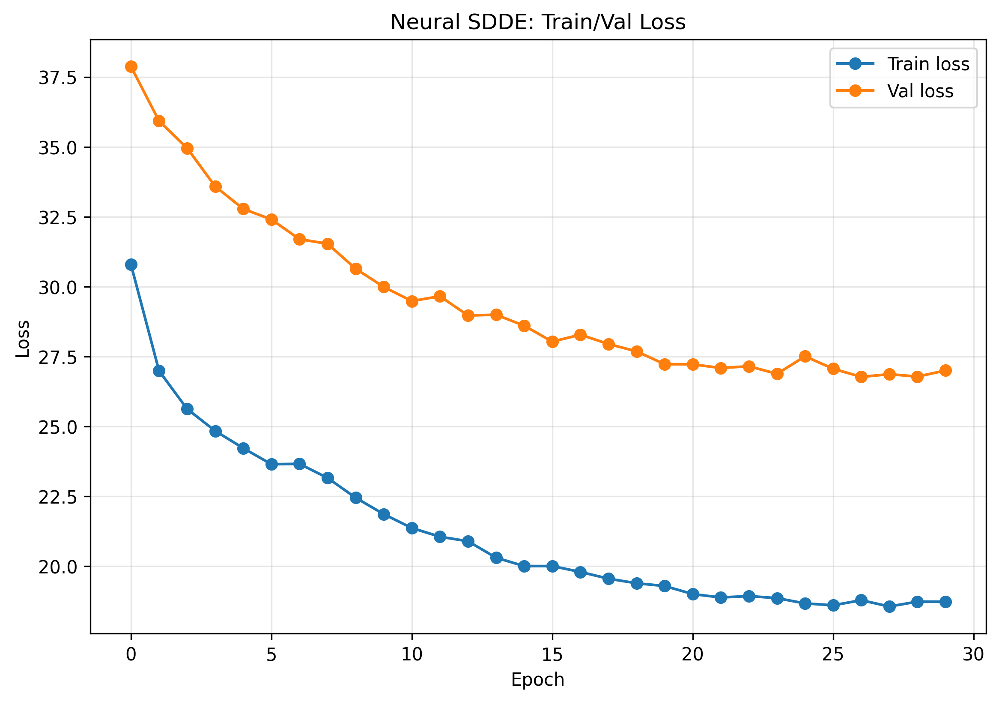

In [8]:
# --- Train (smooth + warm diffusion + cosine LR) + history
model, history = train_sdde_smooth(bundle_train, bundle_val)

# --- Plot train/val loss
plot_loss_history(history)

VAL eval: 100%|██████████| 1178/1178 [03:37<00:00,  5.42it/s]


Validation report: {'per_band_wrmse': {'u': 51.1789639289386, 'g': 149.76125590042054, 'r': 138.11204734452645, 'i': 158.80051668689805, 'z': 210.13371614330168, 'y': 352.46056549627235}, 'per_band_mae': {'u': 117.29518321882131, 'g': 112.83758655706953, 'r': 101.50483241317126, 'i': 101.86529913023013, 'z': 134.87434024701258, 'y': 170.13804975133164}, 'overall_wrmse': 172.1197378395835, 'overall_mae': 128.08452121384266, 'num_val_objects': 1178, 'total_points': 39905}


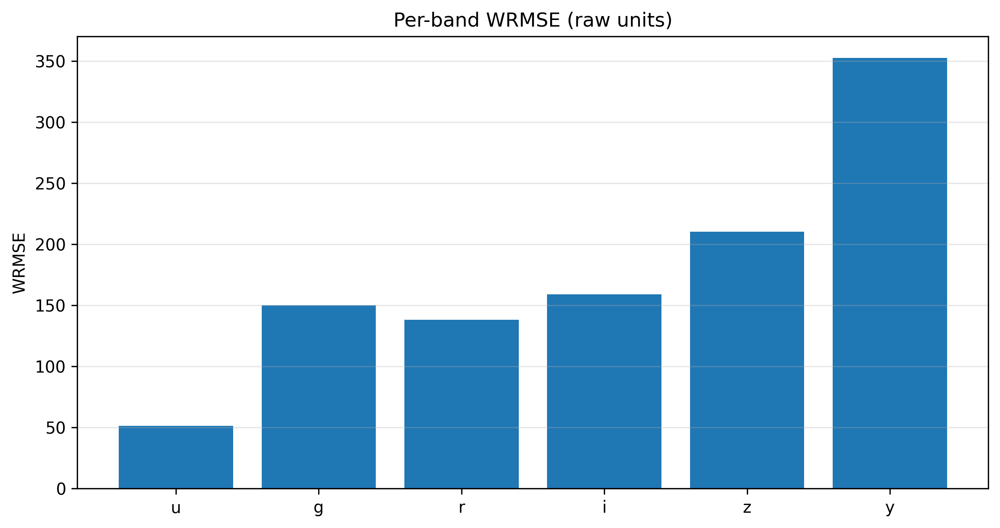

Overall WRMSE: 172.1197 | Overall MAE: 128.0845 | Num val objects: 1178 | Total points: 39905


In [9]:
# --- Validate (raw units) on VAL
report = evaluate_bundle_raw_metrics(model, bundle_val, object_data_val, diff_scale=1.0)
print("Validation report:", report)
plot_wrmse_bars(report)

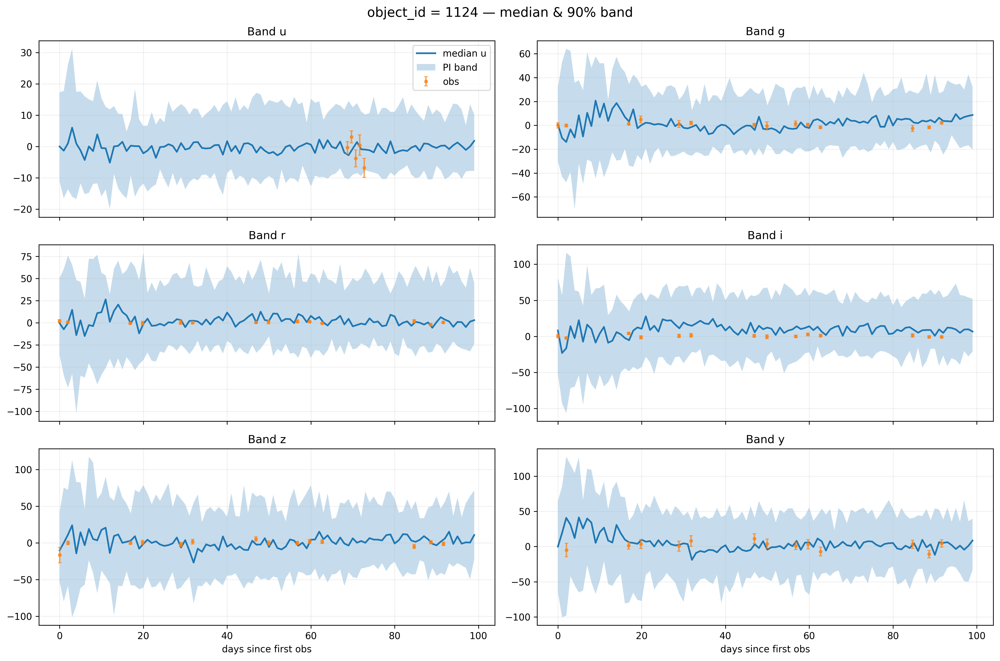

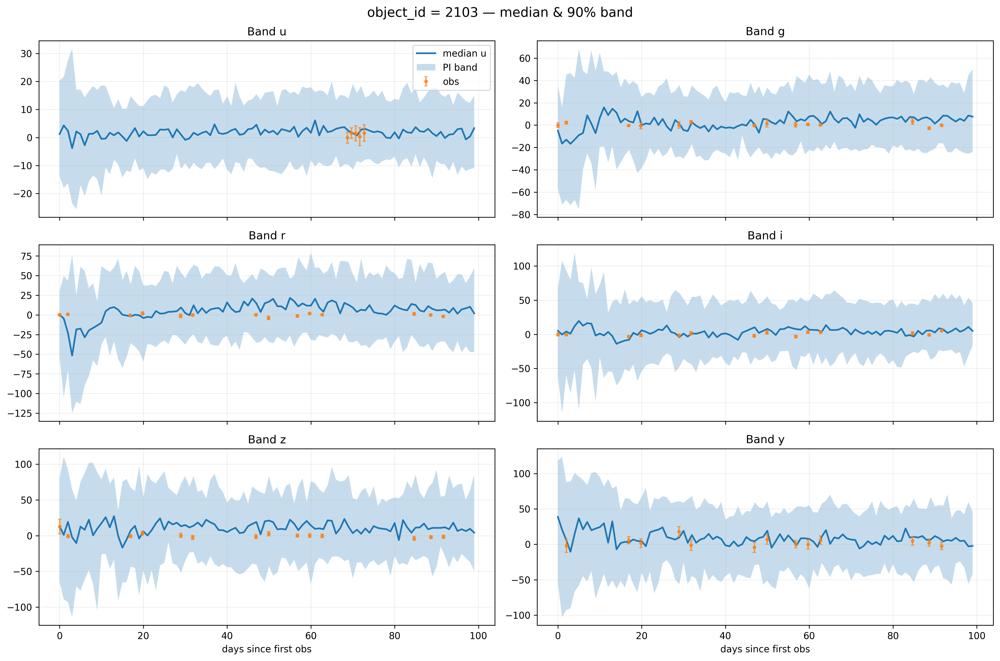

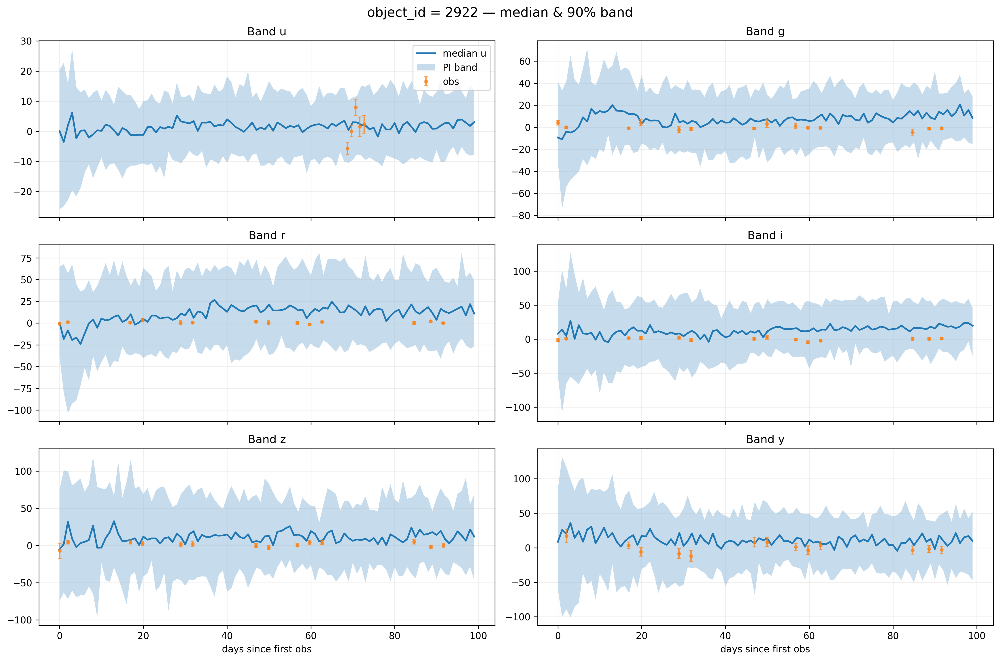

In [10]:
# --- Fan charts (median + 90% PI) for a couple of objects
plot_val_examples_fanchart(model, object_data_val, bundle_val, oids=None, max_plots=3, S=30, alpha=0.10, figsize=(15,10))

In [11]:
# --- Empirical coverage of 90% PI (overall + per band)
cov = empirical_coverage_ensemble(model, bundle_val, object_data_val, alpha=0.10, S=15, max_objects=150, diff_scale=1.0 )
print("Empirical coverage:", cov)

Coverage: 100%|██████████| 150/150 [06:51<00:00,  2.74s/it]

Empirical coverage: {'overall': 0.9219409282700421, 'per_band': {'u': 0.9077380952380952, 'g': 0.908013276434329, 'r': 0.9174964438122333, 'i': 0.9222380275011854, 'z': 0.9407302038880986, 'y': 0.9304347826086956}, 'interval': '90%'}


Coverage: 100%|██████████| 120/120 [03:52<00:00,  1.93s/it]


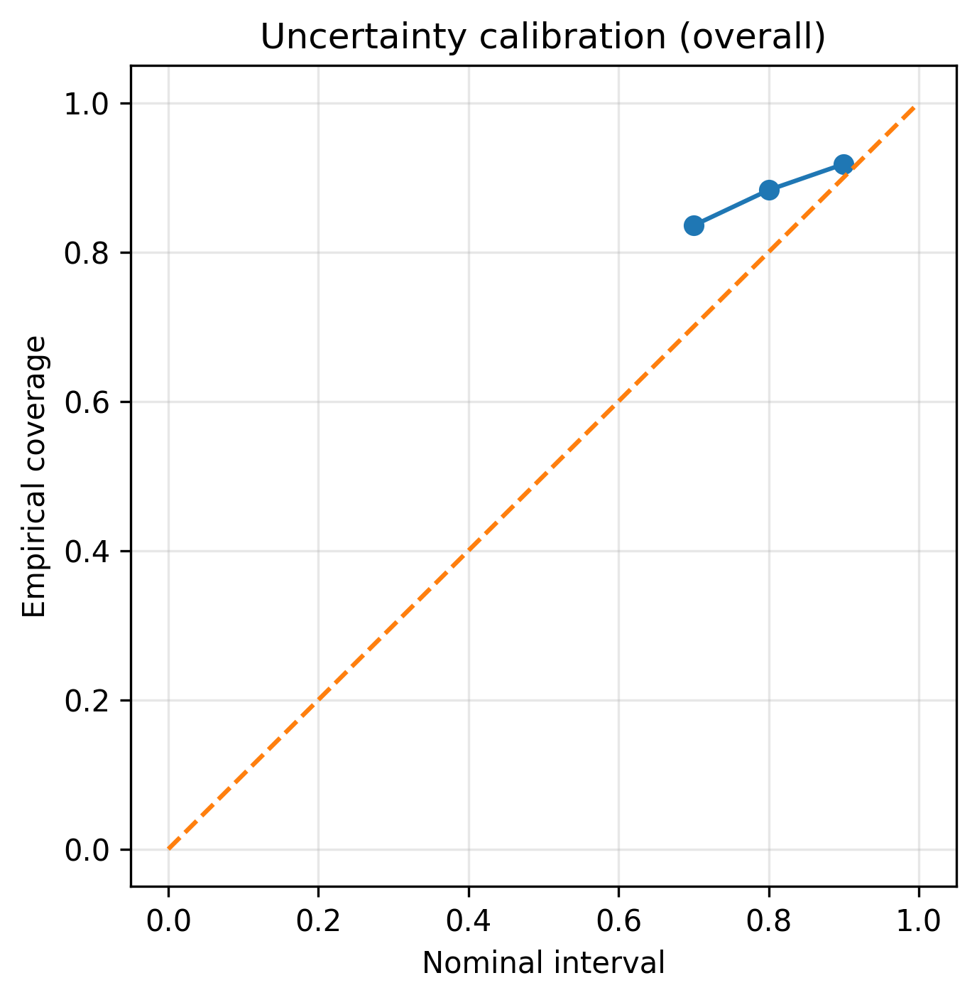

In [12]:
# --- Uncertainty calibration curve (quick check)
levels = [0.70, 0.80, 0.90]
emp = []
for L in levels:
    c = empirical_coverage_ensemble(model, bundle_val, object_data_val, alpha=1-L, S=10, max_objects=120)
    emp.append(c["overall"])

plt.figure(figsize=(5,5))
plt.plot(levels, emp, marker='o')
plt.plot([0,1],[0,1],'--') # ideal
plt.xlabel("Nominal interval")
plt.ylabel("Empirical coverage")
plt.title("Uncertainty calibration (overall)")
plt.grid(True, alpha=0.3)
plt.show()

Err-vs-FluxErr: 100%|██████████| 1178/1178 [03:37<00:00,  5.41it/s]


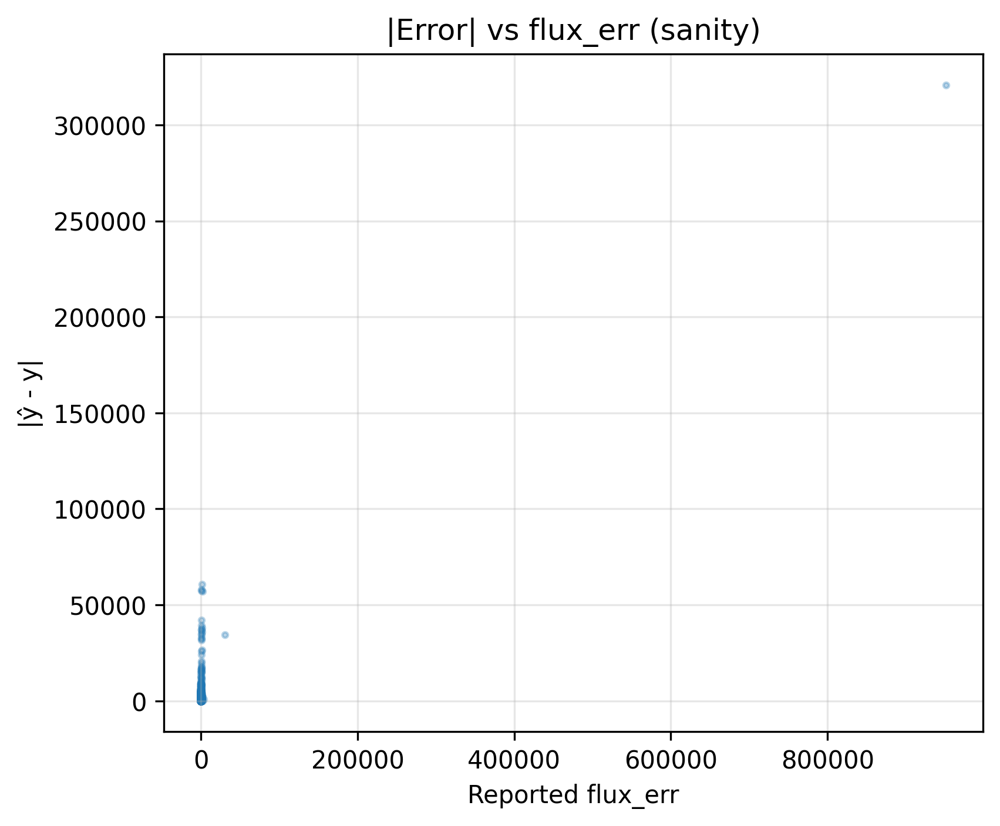

In [13]:
# --- Error vs. reported flux_err sanity check 
plot_err_vs_fluxerr(model, bundle_val, object_data_val, max_points=100_000, figsize=(6,5))

In [14]:
# --- Ablation: stochastic vs deterministic 
rep_stoch, rep_det = compare_diffusion_ablation(model, bundle_val, object_data_val)

VAL eval: 100%|██████████| 1178/1178 [03:31<00:00,  5.58it/s]

Stochastic (diffusion on) : {'per_band_wrmse': {'u': 51.892672623886824, 'g': 149.45944658102226, 'r': 138.2526750206467, 'i': 161.26201193373979, 'z': 213.55669619592945, 'y': 356.90430309918435}, 'per_band_mae': {'u': 117.63764026089291, 'g': 113.01688112997411, 'r': 102.33256001193018, 'i': 102.39159026444992, 'z': 137.17927276823733, 'y': 172.8999706156655}, 'overall_wrmse': 173.68339944697829, 'overall_mae': 129.50896474795002, 'num_val_objects': 1178, 'total_points': 39905}
Deterministic (diff=0.0)  : {'per_band_wrmse': {'u': 52.04576907470515, 'g': 148.94002761945805, 'r': 136.66687635364337, 'i': 157.9740458932504, 'z': 210.07673141832396, 'y': 355.0174138021214}, 'per_band_mae': {'u': 116.77557555088818, 'g': 109.05462498276184, 'r': 95.61625869938952, 'i': 95.15328630554754, 'z': 129.62681545527747, 'y': 166.7852138772046}, 'overall_wrmse': 171.83537213014216, 'overall_mae': 123.59775401293342, 'num_val_objects': 1178, 'total_points': 39905}


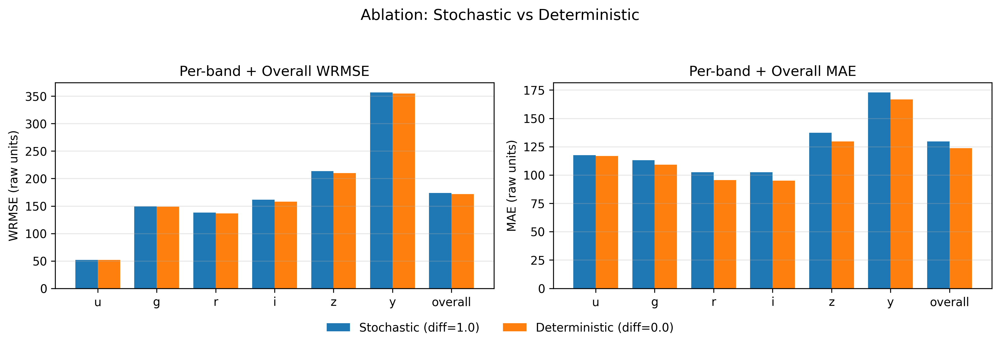

In [15]:
plot_ablation_bars(rep_stoch, rep_det)

In [16]:
# Choose an output root directory for cached grids
# CACHE SDDE OUTPUTS (deterministic) FOR TRANSFORMER TRAINING
CACHE_ROOT = r"...\SDDE Cache"

cache_sdde_outputs(
    model,
    object_data_train,
    band_mean_train,
    band_std_train,
    CACHE_ROOT,
    split_name="train",
    deterministic=True,
    dtype="float16"
)

cache_sdde_outputs(
    model,
    object_data_val,
    band_mean_train,
    band_std_train,
    CACHE_ROOT,
    split_name="val",
    deterministic=True,
    dtype="float16"
)

cache_sdde_outputs(
    model,
    object_data_test,
    band_mean_train,   # use TRAIN stats for consistency
    band_std_train,
    CACHE_ROOT,
    split_name="test",
    deterministic=True,
    dtype="float16"
)

print("Done. Train the Transformer by reading the cached [DAYS×6] grids from sdde_cache/train|val.")

Caching SDDE outputs → C:\Users\Suraj\MSc Data Science(University of Surrey)\Dissertation\PyTorch\SDDE Cache\sdde_cache\train  (deterministic=True, dtype=<class 'numpy.float16'>)


Caching train: 100%|██████████| 5492/5492 [00:00<00:00, 12962.10it/s]


Wrote 5492 arrays, index → C:\Users\Suraj\MSc Data Science(University of Surrey)\Dissertation\PyTorch\SDDE Cache\sdde_cache\train\index.csv
Caching SDDE outputs → C:\Users\Suraj\MSc Data Science(University of Surrey)\Dissertation\PyTorch\SDDE Cache\sdde_cache\val  (deterministic=True, dtype=<class 'numpy.float16'>)


Caching val: 100%|██████████| 1178/1178 [00:00<00:00, 15906.03it/s]


Wrote 1178 arrays, index → C:\Users\Suraj\MSc Data Science(University of Surrey)\Dissertation\PyTorch\SDDE Cache\sdde_cache\val\index.csv
Caching SDDE outputs → C:\Users\Suraj\MSc Data Science(University of Surrey)\Dissertation\PyTorch\SDDE Cache\sdde_cache\test  (deterministic=True, dtype=<class 'numpy.float16'>)


Caching test: 100%|██████████| 1178/1178 [00:00<00:00, 14757.38it/s]

Wrote 1178 arrays, index → C:\Users\Suraj\MSc Data Science(University of Surrey)\Dissertation\PyTorch\SDDE Cache\sdde_cache\test\index.csv
Done. Train the Transformer by reading the cached [DAYS×6] grids from sdde_cache/train|val.


In [17]:
# ============================================================
# Transformer Architecture (SDDE → Tokens → Encoder → Classifier)
# Train with CE; Validate with PLAsTiCC WMLL (+ CE val as diagnostic)
# Confusion matrix (normalized) with numbers & full class labels.
# ============================================================

import os, glob, math, json, random
from typing import Dict, List
import numpy as np
import pandas as pd
import matplotlib.pyplot as plt

import torch
import torch.nn as nn
from torch.utils.data import Dataset, DataLoader
from sklearn.metrics import confusion_matrix, classification_report
from tqdm.auto import tqdm

# -----------------------
# Reproducibility & Device
# -----------------------
SEED = 42
random.seed(SEED); np.random.seed(SEED); torch.manual_seed(SEED); torch.cuda.manual_seed_all(SEED)
DEVICE = 'cuda' if torch.cuda.is_available() else 'cpu'

# -----------------------
# Paths / Config
# -----------------------
# SDDE cache produced earlier by `cache_sdde_outputs(...)`
CACHE_ROOT  = r"....\SDDE Cache"
CACHE_TRAIN = os.path.join(CACHE_ROOT, "sdde_cache", "train")
CACHE_VAL   = os.path.join(CACHE_ROOT, "sdde_cache", "val")

# SDDE horizon (days) used when caching
L = 100
BANDS = ['u','g','r','i','z','y']

# Metadata columns (must exist in train_metadata)
META_COLS = [
    'ddf_bool','hostgal_photoz','hostgal_photoz_err','distmod','mwebv',
    'tflux_u','tflux_g','tflux_r','tflux_i','tflux_z','tflux_y'
]
USE_COLUMNS = ['object_id'] + META_COLS + ['true_target']  # labels come from here

# Transformer sizes
D_MODEL   = 128
N_HEAD    = 8
FFN_HID   = 256
N_LAYERS  = 3
DROPOUT   = 0.10
MAX_LEN   = L + len(META_COLS) + 16   # room for LC+META tokens

# DataLoader config
BATCH_TRAIN = 32
BATCH_VAL   = 64
NUM_WORKERS = 0
PERSISTENT  = False
PIN         = (DEVICE == 'cuda')

# -----------------------
# OFFICIAL PLAsTiCC class weights (no class 99)
# (rare classes 6, 15, 64, 95 are weight 2)
# -----------------------
OFFICIAL_WMLL_WEIGHTS = {
    6:2, 15:2, 16:1, 42:1, 52:1, 53:1, 62:1, 64:2, 65:1, 67:1, 88:1, 90:1, 92:1, 95:2
}

# -----------------------
# Require train_metadata present with columns above
# -----------------------
if 'train_metadata' not in globals():
    raise RuntimeError("Expected a DataFrame `train_metadata` with metadata + true_target in memory.")

missing_cols = [c for c in USE_COLUMNS if c not in train_metadata.columns]
if missing_cols:
    raise ValueError(f"`train_metadata` is missing columns: {missing_cols}")

# -----------------------
# Utility: cache listing + metadata scaling
# -----------------------
def list_cache(cache_dir: str) -> pd.DataFrame:
    """Return manifest with columns: object_id, path. Safe if folder missing/empty."""
    if not os.path.isdir(cache_dir):
        print(f"[WARN] Cache dir does not exist: {cache_dir}")
        return pd.DataFrame(columns=["object_id", "path"])
    recs = []
    for p in glob.glob(os.path.join(cache_dir, "*.npy")):
        name = os.path.splitext(os.path.basename(p))[0]
        try:
            oid = int(name)
        except:
            continue
        recs.append({"object_id": oid, "path": p})
    if not recs:
        print(f"[WARN] No .npy files found in: {cache_dir}")
        return pd.DataFrame(columns=["object_id", "path"])
    return pd.DataFrame(recs).sort_values("object_id").reset_index(drop=True)

def fit_meta_scaler(df: pd.DataFrame, cols: List[str]) -> Dict[str, Dict[str, float]]:
    s = {}
    for c in cols:
        x = pd.to_numeric(df[c], errors='coerce').to_numpy()
        mu = float(np.nanmean(x))
        sd = float(np.nanstd(x))
        if not np.isfinite(sd) or sd == 0: sd = 1.0
        s[c] = {"mean": mu, "std": sd}
    return s

def apply_meta_scaler(df: pd.DataFrame, cols: List[str], scaler: Dict[str, Dict[str, float]]) -> pd.DataFrame:
    out = df.copy()
    for c in cols:
        x = pd.to_numeric(out[c], errors='coerce')
        out[c] = ((x - scaler[c]["mean"]) / scaler[c]["std"]).astype(np.float32)
    return out

# -----------------------
# Build manifests (train/val) from cache + metadata
# -----------------------
man_train = list_cache(CACHE_TRAIN)
man_val   = list_cache(CACHE_VAL)

# Join metadata/labels
meta_full = train_metadata[USE_COLUMNS].copy()
man_train = man_train.merge(meta_full, on='object_id', how='left')
man_val   = man_val.merge(meta_full,   on='object_id', how='left')

# Train-only fill for NaNs, then z-score using train stats
train_medians = man_train[META_COLS].apply(pd.to_numeric, errors='coerce').median(numeric_only=True)
for c in META_COLS:
    man_train[c] = pd.to_numeric(man_train[c], errors='coerce').fillna(train_medians[c])
    man_val[c]   = pd.to_numeric(man_val[c],   errors='coerce').fillna(train_medians[c])

meta_scaler = fit_meta_scaler(man_train, META_COLS)
man_train_z = apply_meta_scaler(man_train[['object_id','path']+META_COLS+['true_target']], META_COLS, meta_scaler)
man_val_z   = apply_meta_scaler(man_val[['object_id','path']+META_COLS+['true_target']],   META_COLS, meta_scaler)

print(f"[OK] Train rows: {len(man_train_z)} | Val rows: {len(man_val_z)}")
print("[OK] Example z-scored meta row (train):")
if len(man_train_z):
    print(man_train_z.iloc[0][META_COLS])

# -----------------------
# Label mapping  (true_target → contiguous 0..C-1)
# -----------------------
labels_all = pd.concat([man_train_z[['object_id','true_target']],
                        man_val_z[['object_id','true_target']]], axis=0, ignore_index=True)
labels_all['true_target'] = labels_all['true_target'].astype(int)
unique_targets = np.sort(labels_all['true_target'].unique())
id2idx = {int(old): int(i) for i, old in enumerate(unique_targets)}
idx2id = {int(i): int(old) for old, i in id2idx.items()}

man_train_z['target_idx'] = man_train_z['true_target'].astype(int).map(id2idx)
man_val_z['target_idx']   = man_val_z['true_target'].astype(int).map(id2idx)
num_classes = len(unique_targets)
print(f"[OK] classes={num_classes}")
print(labels_all['true_target'].value_counts().sort_index())

with open('label_mapping.json', 'w') as f:
    json.dump({'id2idx': id2idx, 'idx2id': idx2id}, f, indent=2)

# ---- OFFICIAL WMLL weights aligned to contiguous indices
missing_w = [cid for cid in unique_targets if cid not in OFFICIAL_WMLL_WEIGHTS]
if missing_w:
    raise ValueError(f"Missing official WMLL weights for classes: {missing_w}")
val_wll_weights = np.array([OFFICIAL_WMLL_WEIGHTS[idx2id[j]] for j in range(num_classes)], dtype=np.float64)

# ---- Human-readable class labels (paper names + original ID)
CLASS_NAME_BY_ID = {
    6:  "Point source microlensing (µlens) – 6",
    15: "Tidal disruption event (TDE) – 15",
    16: "Eclipsing binary event (EBE) – 16",
    42: "Core-collapse SN Type II (SNII) – 42",
    52: "Supernova Type Ia-x (SNIax) – 52",
    53: "Mira Variable – 53",
    62: "Core-collapse SN Type Ibc (SNIbc) – 62",
    64: "Kilonova (KN) – 64",
    65: "M-dwarf – 65",
    67: "Supernova Type Ia-91bg (SNIa-91bg) – 67",
    88: "Active galactic nucleus (AGN) – 88",
    90: "Supernova Type Ia (SNIa) – 90",
    92: "RR Lyrae – 92",
    95: "Super Luminous Supernova (SLSN) – 95",
}
IDX_LABELS = [CLASS_NAME_BY_ID[idx2id[i]] for i in range(num_classes)]

# -----------------------
# Dataset / Collate (reads SDDE cached grids)
# -----------------------
class SDDECacheDataset(Dataset):
    """
    Returns:
      grid: [L,6] float32 (raw SDDE fluxes)
      meta: [11] float32 (z-scored)
      y:    int  (0..C-1)
      oid:  int
    """
    def __init__(self, manifest: pd.DataFrame, seq_len:int=L):
        self.man = manifest.reset_index(drop=True)
        self.seq_len = seq_len
        self.meta_cols = META_COLS
    
    def __len__(self): return len(self.man)
    
    def __getitem__(self, i):
        row = self.man.iloc[i]
        g = np.load(row['path'])
        if g.ndim != 2 or g.shape[1] != 6:
            raise ValueError(f"Bad grid in {row['path']}: expected [L,6], got {g.shape}")
        # safety crop/pad to seq_len
        out = np.zeros((self.seq_len, 6), np.float32)
        L_in = min(self.seq_len, g.shape[0])
        out[:L_in] = g[:L_in].astype(np.float32)
        meta_vec = row[self.meta_cols].to_numpy(dtype=np.float32)
        y = int(row['target_idx'])
        return {
            "object_id": int(row['object_id']),
            "grid": torch.from_numpy(out),      # [L,6]
            "meta": torch.from_numpy(meta_vec), # [11]
            "y": torch.tensor(y, dtype=torch.long)
        }

def collate(batch):
    oids  = [b["object_id"] for b in batch]
    grids = torch.stack([b["grid"] for b in batch], dim=0)   # [B,L,6]
    metas = torch.stack([b["meta"] for b in batch], dim=0)   # [B,11]
    ys    = torch.stack([b["y"] for b in batch], dim=0)      # [B]
    return {"object_id": oids, "grid": grids, "meta": metas, "y": ys}

ds_train = SDDECacheDataset(man_train_z, seq_len=L)
ds_val   = SDDECacheDataset(man_val_z,   seq_len=L)

dl_train = DataLoader(ds_train, batch_size=BATCH_TRAIN, shuffle=True,
                      num_workers=NUM_WORKERS, pin_memory=PIN, persistent_workers=PERSISTENT)
dl_val   = DataLoader(ds_val,   batch_size=BATCH_VAL,   shuffle=False,
                      num_workers=NUM_WORKERS, pin_memory=PIN, persistent_workers=PERSISTENT)

# -----------------------
# Model Components
# -----------------------
class Conv1x1Embed(nn.Module):
    """1×1 conv over channels (6→d_model) per time step."""
    def __init__(self, in_ch=6, d_model=128, dropout=0.1):
        super().__init__()
        self.proj = nn.Conv1d(in_ch, d_model, kernel_size=1)
        self.ln   = nn.LayerNorm(d_model)
        self.do   = nn.Dropout(dropout)
    def forward(self, x):  # x: [B,L,6]
        x = x.transpose(1,2)                 # [B,6,L]
        h = self.proj(x).transpose(1,2)      # [B,L,d_model]
        h = self.ln(h)
        return self.do(h)

class MetaAsTokens(nn.Module):
    """Map 11 scalars (z-scored) → 11 tokens of size d_model via per-feature affine maps."""
    def __init__(self, n_features=11, d_model=128, dropout=0.1):
        super().__init__()
        self.W = nn.Parameter(torch.randn(n_features, d_model)*0.02)
        self.b = nn.Parameter(torch.zeros(n_features, d_model))
        self.ln = nn.LayerNorm(d_model)
        self.do = nn.Dropout(dropout)
    def forward(self, z):   # z: [B,11]
        B, F = z.shape
        w = self.W.unsqueeze(0).expand(B, -1, -1)    # [B,11,d_model]
        b = self.b.unsqueeze(0).expand(B, -1, -1)    # [B,11,d_model]
        z_exp = z.unsqueeze(-1)                      # [B,11,1]
        t = z_exp * w + b                            # [B,11,d_model]
        t = self.ln(t)
        return self.do(t)

class SinusoidalPE(nn.Module):
    def __init__(self, d_model=128, max_len=512):
        super().__init__()
        pe = torch.zeros(max_len, d_model)
        pos = torch.arange(0, max_len, dtype=torch.float).unsqueeze(1)
        div = torch.exp(torch.arange(0, d_model, 2).float() * (-math.log(10000.0) / d_model))
        pe[:, 0::2] = torch.sin(pos * div)
        pe[:, 1::2] = torch.cos(pos * div)
        self.register_buffer('pe', pe)  # [max_len,d_model]
    def forward(self, x):   # x: [B,T,d_model]
        T = x.size(1)
        return x + self.pe[:T].unsqueeze(0)

class TokenTypeEmbedding(nn.Module):
    """Two learned vectors: type 0 = LC tokens, type 1 = META tokens."""
    def __init__(self, d_model=128):
        super().__init__()
        self.emb = nn.Embedding(2, d_model)
    def forward(self, x, type_ids):   # x: [B,T,d_model]; type_ids: [B,T] int{0,1}
        return x + self.emb(type_ids)

class EncoderBlock(nn.Module):
    def __init__(self, d_model=128, nhead=8, ffn_hidden=256, dropout=0.1):
        super().__init__()
        self.attn  = nn.MultiheadAttention(d_model, nhead, dropout=dropout, batch_first=True)
        self.ln1   = nn.LayerNorm(d_model)
        self.ffn   = nn.Sequential(
            nn.Linear(d_model, ffn_hidden), nn.GELU(), nn.Dropout(dropout),
            nn.Linear(ffn_hidden, d_model))
        self.ln2   = nn.LayerNorm(d_model)
        self.do    = nn.Dropout(dropout)
    def forward(self, x, attn_mask=None, need_weights=False):
        h, w = self.attn(x, x, x, attn_mask=attn_mask, need_weights=need_weights, average_attn_weights=False)
        x = self.ln1(x + self.do(h))
        h = self.ffn(x)
        x = self.ln2(x + self.do(h))
        return (x, w) if need_weights else x

class T2InputEncoder(nn.Module):
    """LC tokens + 11 META tokens → PE + token-type → N encoder blocks."""
    def __init__(self, d_model=128, nhead=8, ffn_hidden=256, n_layers=3, dropout=0.1, max_len=512):
        super().__init__()
        self.lc_embed   = Conv1x1Embed(6, d_model, dropout)
        self.meta_embed = MetaAsTokens(len(META_COLS), d_model, dropout)
        self.pe         = SinusoidalPE(d_model, max_len=max_len)
        self.type_emb   = TokenTypeEmbedding(d_model)
        self.blocks     = nn.ModuleList([
            EncoderBlock(d_model, nhead, ffn_hidden, dropout) for _ in range(n_layers)
        ])
    def forward(self, lc_grid, meta_vec, return_first_attn=False):
        """
        lc_grid: [B,L,6]
        meta_vec: [B,11]
        returns tokens [B, L+11, d_model] or (tokens, attn0) if return_first_attn
        """
        B, L_, _ = lc_grid.shape
        lc_tok   = self.lc_embed(lc_grid)             # [B,L,d]
        meta_tok = self.meta_embed(meta_vec)          # [B,11,d]
        x = torch.cat([lc_tok, meta_tok], dim=1)      # [B, L+11, d]
        ttype = torch.zeros((B, L_ + len(META_COLS)), dtype=torch.long, device=x.device)
        ttype[:, L_:] = 1
        x = self.type_emb(self.pe(x), ttype)          # add PE + token-type
        if return_first_attn:
            x, attn0 = self.blocks[0](x, need_weights=True)
            for b in self.blocks[1:]:
                x = b(x)
            return x, attn0
        else:
            for b in self.blocks:
                x = b(x)
            return x

class GAPHead(nn.Module):
    def __init__(self, d_model=128, n_classes=14, dropout=0.1):
        super().__init__()
        self.do = nn.Dropout(dropout)
        self.fc = nn.Linear(d_model, n_classes)
    def forward(self, tokens):  # [B,T,d_model]
        x = tokens.mean(dim=1)  # GAP
        return self.fc(self.do(x))

class T2Classifier(nn.Module):
    def __init__(self, L=100, d_model=128, n_layers=3, nhead=8, dim_ff=256, dropout=0.1, num_classes=14):
        super().__init__()
        self.encoder = T2InputEncoder(d_model=d_model, nhead=nhead, ffn_hidden=dim_ff,
                                      n_layers=n_layers, dropout=dropout, max_len=(L+len(META_COLS)+16))
        self.head = GAPHead(d_model=d_model, n_classes=num_classes, dropout=dropout)
    def forward(self, lc_grid, meta_vec, return_first_attn=False):
        tokens = self.encoder(lc_grid, meta_vec, return_first_attn=return_first_attn)
        if isinstance(tokens, tuple):
            toks, attn0 = tokens
            return self.head(toks), attn0
        else:
            return self.head(tokens)

# -----------------------
# Quick smoke test (optional)
# -----------------------
if len(man_train_z):
    batch = next(iter(DataLoader(SDDECacheDataset(man_train_z), batch_size=1)))
    grid = batch['grid'][:1].to(DEVICE); meta = batch['meta'][:1].to(DEVICE)
    enc = T2InputEncoder(d_model=D_MODEL, nhead=N_HEAD, ffn_hidden=FFN_HID,
                         n_layers=N_LAYERS, dropout=DROPOUT, max_len=MAX_LEN).to(DEVICE)
    with torch.no_grad(): toks, _ = enc(grid, meta, return_first_attn=True)
    print("[OK] tokens:", tuple(toks.shape))

# -----------------------
# Metrics & Loss helpers
# -----------------------
def make_class_weights(train_targets_idx: np.ndarray, num_classes: int) -> torch.Tensor:
    counts = np.bincount(train_targets_idx, minlength=num_classes).astype(np.float32)
    weights = counts.sum() / np.maximum(counts, 1.0)
    weights = weights / weights.mean()  # normalize around 1
    return torch.tensor(weights, dtype=torch.float32)

def plasticc_weighted_logloss(y_true_idx: np.ndarray, prob: np.ndarray, class_weights: np.ndarray) -> float:
    """
    Official PLAsTiCC-style weighted multi-class log-loss (WMLL),
    excluding class 99, normalized by the sum of weights of PRESENT classes.
    """
    eps = 1e-15
    prob = np.clip(prob, eps, 1.0)
    C = prob.shape[1]
    w = np.asarray(class_weights, dtype=np.float64)
    loss_per_class = np.zeros(C, dtype=np.float64)
    present = np.zeros(C, dtype=bool)
    for j in range(C):
        idx = (y_true_idx == j)
        if idx.any():
            present[j] = True
            loss_per_class[j] = -np.log(prob[idx, j]).mean()
    denom = np.maximum(w[present].sum(), 1e-12)
    return float(np.sum(w * loss_per_class) / denom)

# -----------------------
# Build loaders
# -----------------------
train_loader = DataLoader(SDDECacheDataset(man_train_z, seq_len=L),
                          batch_size=BATCH_TRAIN, shuffle=True,
                          num_workers=NUM_WORKERS, pin_memory=PIN, persistent_workers=PERSISTENT)
val_loader   = DataLoader(SDDECacheDataset(man_val_z,   seq_len=L),
                          batch_size=BATCH_VAL, shuffle=False,
                          num_workers=NUM_WORKERS, pin_memory=PIN, persistent_workers=PERSISTENT)

# -----------------------
# Model / Optim / Scheduler
# -----------------------
model = T2Classifier(L=L, d_model=D_MODEL, n_layers=N_LAYERS, nhead=N_HEAD,
                     dim_ff=FFN_HID, dropout=DROPOUT, num_classes=num_classes).to(DEVICE)

# class weights for TRAIN CE (inverse-freq on *train objects*)
train_targets_idx = man_train_z['target_idx'].to_numpy()
ce_class_weights = make_class_weights(train_targets_idx, num_classes).to(DEVICE)

criterion_train = nn.CrossEntropyLoss(weight=ce_class_weights)   # training loss
criterion_val_ce = nn.CrossEntropyLoss(weight=ce_class_weights)  # diagnostic CE on val

opt = torch.optim.AdamW(model.parameters(), lr=5e-4, weight_decay=1e-4)
EPOCHS = 25
steps_per_epoch = max(1, len(train_loader))
T_max = steps_per_epoch * EPOCHS
scheduler = torch.optim.lr_scheduler.CosineAnnealingLR(opt, T_max=T_max)
scaler = torch.cuda.amp.GradScaler(enabled=(DEVICE=='cuda'))

best_val = float('inf'); best_state = None
hist = {'train_ce':[], 'val_ce':[], 'train_acc':[], 'val_acc':[], 'val_wll':[]}

# -----------------------
# Training loop (CE train; WMLL for model selection)
# -----------------------
for ep in range(1, EPOCHS+1):
    # ---- TRAIN
    model.train()
    run_loss, run_acc, n = 0.0, 0.0, 0
    for batch in tqdm(train_loader, desc=f"Epoch {ep}/{EPOCHS} [train]"):
        x = batch['grid'].to(DEVICE, non_blocking=True)
        m = batch['meta'].to(DEVICE, non_blocking=True)
        y = batch['y'].to(DEVICE, non_blocking=True)

        opt.zero_grad(set_to_none=True)
        with torch.cuda.amp.autocast(enabled=(DEVICE=='cuda')):
            logits = model(x, m)
            loss = criterion_train(logits, y)
        scaler.scale(loss).backward()
        torch.nn.utils.clip_grad_norm_(model.parameters(), 1.0)
        scaler.step(opt); scaler.update()
        scheduler.step()

        run_loss += float(loss.item()) * x.size(0)
        run_acc  += (logits.argmax(1) == y).float().sum().item()
        n += x.size(0)
    tr_loss = run_loss/n; tr_acc = run_acc/n

    # ---- VALIDATION (compute CE diagnostic + WMLL)
    model.eval()
    v_ce, v_acc, n = 0.0, 0.0, 0
    all_probs, all_tgts = [], []
    with torch.no_grad():
        for batch in tqdm(val_loader, desc=f"Epoch {ep}/{EPOCHS} [val]"):
            x = batch['grid'].to(DEVICE)
            m = batch['meta'].to(DEVICE)
            y = batch['y'].to(DEVICE)
            logits = model(x, m)
            ce_loss = criterion_val_ce(logits, y)  # diagnostic CE
            v_ce += float(ce_loss.item()) * x.size(0)

            v_acc += (logits.argmax(1) == y).float().sum().item()
            n += x.size(0)
            all_probs.append(logits.softmax(1).cpu().numpy())
            all_tgts.append(y.cpu().numpy())
    va_ce  = v_ce/n; va_acc = v_acc/n
    probs  = np.concatenate(all_probs, axis=0)
    tgts   = np.concatenate(all_tgts, axis=0)
    val_wll = plasticc_weighted_logloss(tgts, probs, class_weights=val_wll_weights)

    hist['train_ce'].append(tr_loss); hist['val_ce'].append(va_ce)
    hist['train_acc'].append(tr_acc); hist['val_acc'].append(va_acc)
    hist['val_wll'].append(val_wll)

    print(f"Epoch {ep:02d} | "
          f"train_CE={tr_loss:.3f} acc={tr_acc:.3f} | "
          f"val_CE={va_ce:.3f} acc={va_acc:.3f} | "
          f"val_WMLL={val_wll:.4f}")

    # Select best by WMLL (primary metric)
    if val_wll < best_val:
        best_val = val_wll
        best_state = { 'model': model.state_dict(), 'epoch': ep }
        torch.save(best_state, "t2_classifier_best.pth")

# -----------------------
# Plots – Positional Encoding (heatmap)
# -----------------------
def plot_pe_heatmap(model, T, title="Sinusoidal positional encoding (channels × positions)"):
    """
    model : your T2Classifier (has encoder.pe.pe buffer)
    T     : number of positions to show (e.g., L or L+11 if you want LC+META)
    """
    # grab the actual PE tensor used by the encoder
    try:
        PE = model.encoder.pe.pe.detach().cpu().numpy()  # [max_len, d_model]
    except AttributeError:
        # if your nesting differs, fall back to a deeper path
        PE = model.encoder.encoder.pe.pe.detach().cpu().numpy()

    # transpose to channels × positions for the plot
    H = PE[:T].T  # shape: [d_model, T]

    fig, ax = plt.subplots(figsize=(12,4))
    im = ax.imshow(H, aspect='auto', interpolation='nearest',
                   vmin=-1.0, vmax=1.0, cmap='coolwarm')
    cbar = fig.colorbar(im, ax=ax, fraction=0.046, pad=0.04)
    cbar.set_label("Value", rotation=90)

    ax.set_title(title)
    ax.set_xlabel("Position")
    ax.set_ylabel("Embedding channel")

    # lighter layout to prevent overlaps
    plt.tight_layout()
    plt.show()

# -----------------------
# Plots: CE (train & val), Accuracy (train & val), Val WMLL
# -----------------------

def plot_training_curves(hist, figsize=(16,4)):
    """
    Plot training history curves:
    - Cross-Entropy (train & val)
    - Accuracy (train & val)
    - Val WMLL

    Args:
        hist: dict with keys ['train_ce','val_ce','train_acc','val_acc','val_wll']
        figsize: tuple for matplotlib figure size
    """
    fig, ax = plt.subplots(1, 3, figsize=figsize)

    # CE
    ax[0].plot(hist['train_ce'], marker='o', label='Train CE')
    ax[0].plot(hist['val_ce'], marker='o', label='Val CE')
    ax[0].set_title("Cross-Entropy (Train & Val)")
    ax[0].set_xlabel("Epoch"); ax[0].grid(True, alpha=0.3); ax[0].legend()

    # Accuracy
    ax[1].plot(hist['train_acc'], marker='o', label='Train')
    ax[1].plot(hist['val_acc'], marker='o', label='Val')
    ax[1].set_title("Train & Val Accuracy")
    ax[1].set_xlabel("Epoch"); ax[1].grid(True, alpha=0.3); ax[1].legend()

    # Val WMLL
    ax[2].plot(hist['val_wll'], marker='o', label='Val WMLL')
    ax[2].set_title("PLAsTiCC weighted log-loss (val)")
    ax[2].set_xlabel("Epoch"); ax[2].grid(True, alpha=0.3); ax[2].legend()

    plt.tight_layout()
    plt.show()

# -----------------------
# MHA / CAM helpers
# -----------------------
@torch.no_grad()
def get_tokens_and_attn(model, lc_grid, meta_vec):
    """
    Returns:
      toks: [T, d] tokens AFTER all encoder blocks (pre-GAP)
      attn_list: list of length N_LAYERS, each (H, T, T) attention matrix
      split: int, index where LC tokens end and META tokens start (= L)
    """
    enc = model.encoder
    B, L, _ = lc_grid.shape
    # embed + concat + PE + token-type
    lc_tok   = enc.lc_embed(lc_grid.to(DEVICE))           # [B,L,d]
    meta_tok = enc.meta_embed(meta_vec.to(DEVICE))        # [B,11,d]
    x = torch.cat([lc_tok, meta_tok], dim=1)              # [B,L+11,d]
    ttype = torch.zeros((B, L + len(META_COLS)), dtype=torch.long, device=x.device)
    ttype[:, L:] = 1
    x = enc.type_emb(enc.pe(x), ttype)

    # run blocks and collect attention
    attn_list = []
    for blk in enc.blocks:
        x, w = blk(x, need_weights=True)                  # w: [B,H,T,T]
        attn_list.append(w.squeeze(0).detach().cpu())     # (H,T,T)
    toks = x.squeeze(0).detach().cpu()                    # (T,d)
    return toks, attn_list, L

# Plot — Layer-wise attention heatmaps (averaged over heads)
# Gives 3 heatmaps (one per encoder block). The LC|META split is marked.
def plot_attention_heatmaps(attn_list, split, title="Self-attention (averaged over heads)"):
    LAY = len(attn_list)
    T = attn_list[0].shape[-1]
    fig, axes = plt.subplots(1, LAY, figsize=(14, 4), constrained_layout=True)
    if LAY == 1: axes = [axes]
    for li, A in enumerate(attn_list):
        Amean = A.mean(0).numpy()                         # (T,T)
        ax = axes[li]
        im = ax.imshow(Amean, cmap='magma', vmin=0, vmax=Amean.max())
        ax.set_title(f"Encoder block L{li+1}")
        ax.set_xlabel("Key"); ax.set_ylabel("Query")
        ax.axvline(split-0.5, color='w', lw=1)
        ax.axhline(split-0.5, color='w', lw=1)
    cbar = fig.colorbar(im, ax=axes, fraction=0.025, pad=0.02)
    cbar.set_label("Attention weight")
    plt.show()

# Plot — Attention distance and entropy (per head, per layer)
# Mean |offset| a head attends to → local vs global behavior
# Entropy → sharp vs diffuse attention
def plot_attention_distance_and_entropy(attn_list):
    import torch
    LAY = len(attn_list)
    H = attn_list[0].shape[0]
    md_all, ent_all = [], []
    for A in attn_list:                                    # A: (H,T,T)
        T = A.shape[-1]
        i = torch.arange(T).unsqueeze(1)
        j = torch.arange(T).unsqueeze(0)
        dist = (i-j).abs().float()                         # (T,T)

        Ahat = A / (A.sum(dim=-1, keepdim=True) + 1e-9)    # normalize across keys
        md = (Ahat * dist).sum(dim=(-1,-2)) / (Ahat.sum(dim=(-1,-2)) + 1e-9)  # (H,)
        ent = -(Ahat * (Ahat+1e-12).log()).sum(dim=-1).mean(dim=-1)           # (H,)
        md_all.append(md.numpy()); ent_all.append(ent.numpy())

    md_all  = np.stack(md_all,  axis=0)                    # (LAY,H)
    ent_all = np.stack(ent_all, axis=0)                    # (LAY,H)

    # mean distance bars
    fig, ax = plt.subplots(1, 2, figsize=(12, 3.6), constrained_layout=True)
    for li in range(LAY):
        ax[0].plot(np.arange(H), md_all[li], marker='o', label=f"L{li+1}")
    ax[0].set_title("Mean attention distance per head")
    ax[0].set_xlabel("Head"); ax[0].set_ylabel("Mean |q−k|"); ax[0].grid(True, alpha=.3); ax[0].legend()

    # entropy heatmap
    im = ax[1].imshow(ent_all, aspect='auto', cmap='viridis')
    ax[1].set_title("Attention entropy (lower = sharper)")
    ax[1].set_xlabel("Head"); ax[1].set_ylabel("Layer")
    ax[1].set_yticks(np.arange(LAY)); ax[1].set_yticklabels([f"L{li+1}" for li in range(LAY)])
    cbar = fig.colorbar(im, ax=ax[1], fraction=0.046, pad=0.04)
    cbar.set_label("Entropy")
    plt.show()


# Plot — Type attention breakdown (LC→LC, LC→META, …) per layer
# Shows whether LC tokens actually read the metadata tokens (and vice versa).
def plot_type_attention_breakdown(attn_list, split):
    labels = ["LC→LC", "LC→META", "META→LC", "META→META"]
    vals = []
    for A in attn_list:                                     # (H,T,T)
        A = A.mean(0).numpy()                               # average heads -> (T,T)
        Qlc = slice(0, split);      Qm = slice(split, None)
        Klc = slice(0, split);      Km = slice(split, None)
        # fractions per query type
        def frac(Q, K):
            num = A[Q, :][:, K].sum()
            den = A[Q, :].sum() + 1e-12
            return float(num / den)
        vals.append([frac(Qlc,Klc), frac(Qlc,Km), frac(Qm,Klc), frac(Qm,Km)])

    vals = np.array(vals)                                   # (LAY,4)
    x = np.arange(len(attn_list))
    w = 0.22
    fig, ax = plt.subplots(figsize=(8.5,3.4))
    for i, lab in enumerate(labels):
        ax.bar(x + (i-1.5)*w, vals[:,i], width=w, label=lab)
    ax.set_xticks(x); ax.set_xticklabels([f"L{li+1}" for li in range(len(attn_list))])
    ax.set_ylim(0,1); ax.set_ylabel("Attention fraction")
    ax.set_title("Type attention breakdown by layer")
    ax.grid(True, axis='y', alpha=.3); ax.legend(ncol=2)
    plt.tight_layout(); plt.show()

# CAM over tokens (which time parts of the Light Curves matter)
@torch.no_grad()
def plot_token_cam(model, lc_grid, meta_vec, idx2id, META_COLS, obj_id=None, target_idx=None):
    """
    Plot per-token CAM for (predicted class) or a specified target_idx.
    Shows LC part over time and META token bars at the end.
    """
    model.eval()
    toks, attn_list, split = get_tokens_and_attn(model, lc_grid, meta_vec)  # toks: (T,d)
    # forward to get logits
    logits = model.head(toks.unsqueeze(0).to(DEVICE)).squeeze(0).cpu().numpy()
    if target_idx is None:
        target_idx = int(logits.argmax())

    w = model.head.fc.weight[target_idx].detach().cpu().numpy()             # (d,)
    s = toks.numpy() @ w                                                    # (T,)
    T = len(s)

    # Normalize for display
    s_norm = (s - s.min()) / (s.max() - s.min() + 1e-9)

    # LC proxy curve = mean flux across 6 bands (rescale to 0..1)
    lc_np = lc_grid.squeeze(0).cpu().numpy()                                # [L,6]
    lc_proxy = lc_np.mean(axis=1)
    lc_proxy = (lc_proxy - lc_proxy.min()) / (lc_proxy.max() - lc_proxy.min() + 1e-9)

    fig, ax1 = plt.subplots(figsize=(12,3.8))
    ax1.plot(np.arange(split), s_norm[:split], lw=2, label="Token CAM (LC)")
    ax1.plot(np.arange(split, T), s_norm[split:], lw=2, label="Token CAM (META)", color='tab:orange')
    ax1.axvline(split-0.5, color='k', lw=1); ax1.axvspan(split-0.5, T-0.5, color='grey', alpha=0.08)
    ax1.set_ylabel("CAM score (normalized)")
    ax1.set_xlabel("Token index")
    pred_id = idx2id[target_idx]
    ax1.set_title(f"Token CAM — target class {pred_id}{' | obj='+str(obj_id) if obj_id is not None else ''}")
    ax1.grid(True, alpha=.25)
    ax1.legend(loc='upper left')

    # overlay LC proxy with a secondary axis
    ax2 = ax1.twinx()
    ax2.plot(np.arange(split), lc_proxy, lw=1.5, linestyle='--', alpha=0.6, label="LC mean flux (scaled)")
    ax2.set_ylabel("LC proxy (scaled 0–1)")
    # merged legend
    h1,l1 = ax1.get_legend_handles_labels(); h2,l2 = ax2.get_legend_handles_labels()
    ax1.legend(h1+h2, l1+l2, loc='upper right', frameon=False)

    plt.tight_layout(); plt.show()

    # META token contributions as a bar chart (optional second figure)
    fig, ax = plt.subplots(figsize=(8,2.6))
    meta_scores = s[split:]
    ax.bar(np.arange(len(meta_scores)), meta_scores, color='tab:orange')
    ax.set_title("Metadata token contributions (raw s_t = w·token)")
    ax.set_xlabel("META token index (aligned with META_COLS order)")
    ax.set_ylabel("Contribution (raw)")
    ax.grid(True, axis='y', alpha=.3)
    plt.tight_layout(); plt.show()

# -----------------------
# Per Class Per-class PR curves (with macro & micro AP)
# -----------------------
import matplotlib.pyplot as plt
import numpy as np

@torch.no_grad()
def collect_val_probs_targets(model, val_loader, device=DEVICE):
    model.eval()
    probs, tgts = [], []
    for batch in val_loader:
        x = batch['grid'].to(device, non_blocking=True)
        m = batch['meta'].to(device, non_blocking=True)
        y = batch['y'].to(device, non_blocking=True)
        logits = model(x, m)
        probs.append(logits.softmax(1).cpu().numpy())
        tgts.append(y.cpu().numpy())
    return np.concatenate(probs, 0), np.concatenate(tgts, 0)

def plot_pr_curves_per_class(probs, tgts, class_names=None, figsize=(12,10)):
    """
    probs: [N, C] predicted probabilities
    tgts:  [N]     integer class labels 0..C-1
    """
    C = probs.shape[1]
    Y = np.eye(C)[tgts]  # one-hot

    # AP per class
    ap = []
    prec, rec = {}, {}
    for j in range(C):
        pj, rj, _ = precision_recall_curve(Y[:, j], probs[:, j])
        prec[j], rec[j] = pj, rj
        ap.append(average_precision_score(Y[:, j], probs[:, j]))

    # micro-average
    prec_mi, rec_mi, _ = precision_recall_curve(Y.ravel(), probs.ravel())
    ap_mi = average_precision_score(Y, probs, average='micro')
    ap_ma = average_precision_score(Y, probs, average='macro')

    # plot
    ncols = 3
    nrows = int(np.ceil(C / ncols))
    fig, axes = plt.subplots(nrows, ncols, figsize=figsize, sharex=True, sharey=True)
    axes = np.array(axes).reshape(nrows, ncols)

    for j in range(C):
        r, c = divmod(j, ncols)
        name = class_names[j] if class_names is not None else f"class {j}"
        axes[r, c].plot(rec[j], prec[j])
        axes[r, c].set_title(f"{name}\nAP={ap[j]:.3f}")
        axes[r, c].grid(True, alpha=0.3)

    # micro/macro small inset at the end
    for k in range(C, nrows*ncols):
        r, c = divmod(k, ncols)
        axes[r, c].axis('off')

    fig.suptitle(f"Per-class Precision–Recall (macro AP={ap_ma:.3f}, micro AP={ap_mi:.3f})", y=0.99)
    for ax in axes[-1]: ax.set_xlabel("Recall")
    for ax in axes[:,0]: ax.set_ylabel("Precision")
    plt.tight_layout(rect=[0,0,1,0.96]); plt.show()

# -----------------------
# Per-class F1 / Recall / Precision bars
# -----------------------
from sklearn.metrics import precision_recall_fscore_support

def plot_f1_prec_rec_bars(tgts, preds, class_names=None, figsize=(12,4.5)):
    """
    tgts, preds: 1D int arrays (0..C-1)
    """
    P, R, F1, support = precision_recall_fscore_support(tgts, preds, labels=np.arange(np.max(tgts)+1), zero_division=0)

    x = np.arange(len(F1))
    w = 0.26
    fig, ax = plt.subplots(figsize=figsize)
    ax.bar(x - w, P, width=w, label="Precision")
    ax.bar(x,     R, width=w, label="Recall")
    ax.bar(x + w, F1, width=w, label="F1")
    ax.set_ylim(0, 1.05)
    ax.set_xticks(x)
    ax.set_xticklabels([cn if class_names is None else cn for cn in (range(len(F1)) if class_names is None else class_names)],
                       rotation=35, ha='right')
    for i, s in enumerate(support):
        ax.text(i, 1.03, f"n={int(s)}", ha='center', va='bottom', fontsize=8)
    ax.set_title("Per-class Precision / Recall / F1 (validation)")
    ax.set_ylabel("Score")
    ax.grid(True, axis='y', alpha=.3)
    ax.legend(ncol=3)
    plt.tight_layout(); plt.show()

# -----------------------
# Ablation bars — “with vs without metadata tokens”
# -----------------------
@torch.no_grad()
def eval_on_val(model, val_loader, device=DEVICE, zero_meta=False, class_weights=None):
    model.eval()
    all_probs, all_tgts = [], []
    for batch in val_loader:
        x = batch['grid'].to(device, non_blocking=True)
        if zero_meta:
            m = torch.zeros_like(batch['meta']).to(device)
        else:
            m = batch['meta'].to(device, non_blocking=True)
        y = batch['y'].to(device, non_blocking=True)
        logits = model(x, m)
        all_probs.append(logits.softmax(1).cpu().numpy())
        all_tgts.append(y.cpu().numpy())
    probs = np.concatenate(all_probs, 0)
    tgts  = np.concatenate(all_tgts, 0)
    preds = probs.argmax(1)
    acc   = (preds == tgts).mean()
    wll   = plasticc_weighted_logloss(tgts, probs, class_weights=class_weights if class_weights is not None else val_wll_weights)
    from sklearn.metrics import precision_recall_fscore_support
    P, R, F1, _ = precision_recall_fscore_support(tgts, preds, zero_division=0)
    return {"probs": probs, "tgts": tgts, "preds": preds, "acc": acc, "wll": wll, "F1": F1}

def plot_ablation_meta_bars(res_with, res_without, class_names=None):
    dF1 = res_with["F1"] - res_without["F1"]
    x = np.arange(len(dF1))
    fig, ax = plt.subplots(figsize=(10.5,3.6))
    ax.bar(x, dF1, width=0.85)
    ax.axhline(0, color='k', lw=1)
    ax.set_xticks(x)
    ax.set_xticklabels([cn if class_names is None else cn for cn in (range(len(dF1)) if class_names is None else class_names)],
                       rotation=35, ha='right')
    ax.set_ylabel("ΔF1 (with META − no META)")
    ax.set_title("Ablation: effect of 11 metadata tokens (per class)")
    ax.grid(True, axis='y', alpha=.3)
    plt.tight_layout(); plt.show()

def run_meta_ablation(model, val_loader, class_names=None):
    res_with = eval_on_val(model, val_loader, zero_meta=False, class_weights=val_wll_weights)
    res_wo   = eval_on_val(model, val_loader, zero_meta=True,  class_weights=val_wll_weights)
    print(f"[ABLAT] With META:  acc={res_with['acc']:.3f}, WMLL={res_with['wll']:.4f}")
    print(f"[ABLAT] No  META:   acc={res_wo['acc']:.3f}, WMLL={res_wo['wll']:.4f}")
    print(f"[ABLAT] Deltas:     Δacc={res_with['acc']-res_wo['acc']:+.3f}, ΔWMLL={res_with['wll']-res_wo['wll']:+.4f}")
    plot_ablation_meta_bars(res_with, res_wo, class_names=[str(idx2id[j]) for j in range(len(IDX_LABELS))] if class_names is None else class_names)

# -----------------------
# Token-CAM gallery (6–9 objects; LC with CAM overlay + META bars)
# -----------------------
import matplotlib.pyplot as plt
import numpy as np
from matplotlib import gridspec

@torch.no_grad()
def _token_cam_single(model, grid, meta, target_idx=None):
    """
    Returns:
      s_norm: (T,) normalized token CAM
      split : int, LC length (L)
      meta_scores: (11,) raw scores for META tokens
      lc_proxy: (L,) mean flux proxy in [0,1]
    """
    model.eval()
    toks, _, split = get_tokens_and_attn(model, grid, meta)       # (T,d)
    logits = model.head(toks.unsqueeze(0).to(DEVICE)).squeeze(0).cpu().numpy()
    if target_idx is None:
        target_idx = int(logits.argmax())

    w = model.head.fc.weight[target_idx].detach().cpu().numpy()
    s = toks.numpy() @ w                                           # (T,)
    s_norm = (s - s.min()) / (s.max() - s.min() + 1e-9)

    lc_np = grid.squeeze(0).cpu().numpy()                          # [L,6]
    lc_proxy = lc_np.mean(axis=1)
    lc_proxy = (lc_proxy - lc_proxy.min()) / (lc_proxy.max() - lc_proxy.min() + 1e-9)

    return s_norm, split, s[split:], lc_proxy, target_idx

def plot_token_cam_gallery(model, ds_val, idx2id, META_COLS, max_items=6, seed=42):
    """
    Picks up to `max_items` diverse validation objects (attempts to spread across classes)
    and plots a 2-panel row per object: (LC CAM) & (META bars).
    """
    rng = np.random.default_rng(seed)
    # sample indices trying to cover classes
    labels = np.array([ds_val[i]['y'].item() for i in range(len(ds_val))])
    chosen = []
    for c in np.unique(labels):
        idx_c = np.where(labels == c)[0]
        if len(idx_c) == 0: continue
        chosen.extend(rng.choice(idx_c, size=1, replace=False).tolist())
        if len(chosen) >= max_items: break
    if len(chosen) < max_items:
        pool = [i for i in range(len(ds_val)) if i not in chosen]
        extra = rng.choice(pool, size=min(max_items-len(chosen), len(pool)), replace=False).tolist()
        chosen.extend(extra)
    chosen = chosen[:max_items]

    n = len(chosen)
    fig = plt.figure(figsize=(12, 2.6*n))
    gs = gridspec.GridSpec(n, 2, width_ratios=[2.1, 1.2], wspace=0.25, hspace=0.6)

    for r, i in enumerate(chosen):
        rec = ds_val[i]
        grid = rec['grid'].unsqueeze(0).to(DEVICE)
        meta = rec['meta'].unsqueeze(0).to(DEVICE)

        s_norm, split, meta_scores, lc_proxy, tgt_idx = _token_cam_single(model, grid, meta)
        pred_id = idx2id[int(tgt_idx)]

        # Left panel: LC CAM overlay
        ax1 = fig.add_subplot(gs[r, 0])
        T = len(s_norm)
        ax1.plot(np.arange(split), lc_proxy, lw=1.3, ls='--', alpha=0.6, label="LC mean flux (scaled)")
        ax1.plot(np.arange(split), s_norm[:split], lw=2.0, label="Token CAM (LC)")
        ax1.axvline(split-0.5, color='k', lw=1)
        ax1.set_xlim(-1, split+2)
        ax1.set_ylim(-0.05, 1.05)
        ax1.set_ylabel("scaled")
        ax1.set_title(f"obj {rec['object_id']} — CAM over LC (pred {pred_id})")
        ax1.grid(True, alpha=.25)
        ax1.legend(loc='upper right', fontsize=8, frameon=False)
        

        # Right panel: META bars
        ax2 = fig.add_subplot(gs[r, 1])
        order = np.argsort(-np.abs(meta_scores))
        ax2.bar(range(len(meta_scores)), meta_scores[order], color='tab:orange')
        ax2.set_xticks(range(len(META_COLS))); 
        ax2.set_xticklabels([META_COLS[k] for k in order], rotation=45, ha='right')
        ax2.set_title("META token contributions (w·token)")
        ax2.grid(True, axis='y', alpha=.3)
        plt.tight_layout()


    plt.tight_layout()
    plt.show()

# -----------------------
# Confusion matrix & Classification Report
# -----------------------
import numpy as np
from sklearn.metrics import confusion_matrix, classification_report

def plot_confusion_and_report(model, ds_val, BATCH_VAL, DEVICE, num_classes, IDX_LABELS, idx2id):
    """
    Plot normalized confusion matrix heatmap + classification report.
    
    Args:
        model: trained model (already loaded with best_state)
        ds_val: validation dataset
        BATCH_VAL: batch size for val DataLoader
        DEVICE: 'cuda' or 'cpu'
        num_classes: number of classes
        IDX_LABELS: list of descriptive labels for y-axis
        idx2id: dict mapping contiguous idx -> original PLAsTiCC class ID
    """
    model.eval()
    y_true, y_pred = [], []
    with torch.no_grad():
        for batch in DataLoader(ds_val, batch_size=BATCH_VAL, shuffle=False):
            logits = model(batch['grid'].to(DEVICE), batch['meta'].to(DEVICE))
            y_true.append(batch['y'].numpy())
            y_pred.append(logits.softmax(1).argmax(1).cpu().numpy())
    y_true = np.concatenate(y_true)
    y_pred = np.concatenate(y_pred)

    # normalized confusion matrix
    cm_norm = confusion_matrix(
        y_true, y_pred,
        labels=list(range(num_classes)),
        normalize='true'
    )

    fig, ax = plt.subplots(figsize=(10, 9))
    im = ax.imshow(cm_norm, interpolation='nearest', cmap='Blues')
    ax.figure.colorbar(im, ax=ax, fraction=0.046, pad=0.04)

    # axis labels
    ax.set_yticks(np.arange(num_classes))
    ax.set_yticklabels(IDX_LABELS)
    ax.set_xticks(np.arange(num_classes))
    ax.set_xticklabels([idx2id[j] for j in range(num_classes)])

    ax.set_ylabel("True")
    ax.set_xlabel("Predicted (original class ID)")
    ax.set_title("Confusion matrix (val, normalized)")
    plt.setp(ax.get_xticklabels(), rotation=45, ha="right")

    # numbers inside cells
    thresh = cm_norm.max() / 2.
    for i in range(num_classes):
        for j in range(num_classes):
            val = cm_norm[i, j]
            ax.text(j, i, f"{val:.2f}",
                    ha="center", va="center",
                    color="white" if val > thresh else "black", fontsize=9)

    plt.tight_layout()
    plt.show()

    # print classification report
    print(classification_report(y_true, y_pred, digits=3))

[OK] Train rows: 5492 | Val rows: 1178
[OK] Example z-scored meta row (train):
ddf_bool              1.632108
hostgal_photoz       -0.658148
hostgal_photoz_err   -0.515181
distmod              -1.536823
mwebv                 -0.43792
tflux_u               0.198014
tflux_g               0.137726
tflux_r               0.064604
tflux_i               0.062628
tflux_z               0.059067
tflux_y               0.080233
Name: 0, dtype: object
[OK] classes=14
true_target
6      128
15     421
16     785
42    1014
52     156
53      25
62     411
64      87
65     834
67     177
88     314
90    1966
92     203
95     149
Name: count, dtype: int64
[OK] tokens: (1, 111, 128)


Epoch 1/25 [val]: 100%|██████████| 19/19 [00:13<00:00,  1.41it/s]


Epoch 01 | train_CE=1.982 acc=0.250 | val_CE=1.519 acc=0.358 | val_WMLL=1.4641


Epoch 2/25 [val]: 100%|██████████| 19/19 [00:02<00:00,  6.73it/s]


Epoch 02 | train_CE=1.463 acc=0.440 | val_CE=1.269 acc=0.553 | val_WMLL=1.2623


Epoch 3/25 [val]: 100%|██████████| 19/19 [00:02<00:00,  7.47it/s]


Epoch 03 | train_CE=1.366 acc=0.482 | val_CE=1.237 acc=0.487 | val_WMLL=1.1787


Epoch 4/25 [val]: 100%|██████████| 19/19 [00:02<00:00,  8.26it/s]


Epoch 04 | train_CE=1.342 acc=0.484 | val_CE=1.203 acc=0.564 | val_WMLL=1.2454


Epoch 5/25 [val]: 100%|██████████| 19/19 [00:02<00:00,  7.52it/s]


Epoch 05 | train_CE=1.250 acc=0.524 | val_CE=1.114 acc=0.550 | val_WMLL=1.0668


Epoch 6/25 [val]: 100%|██████████| 19/19 [00:02<00:00,  7.96it/s]


Epoch 06 | train_CE=1.219 acc=0.499 | val_CE=1.181 acc=0.501 | val_WMLL=1.1392


Epoch 7/25 [val]: 100%|██████████| 19/19 [00:02<00:00,  8.01it/s]


Epoch 07 | train_CE=1.211 acc=0.501 | val_CE=1.102 acc=0.586 | val_WMLL=1.1279


Epoch 8/25 [val]: 100%|██████████| 19/19 [00:02<00:00,  6.61it/s]


Epoch 08 | train_CE=1.151 acc=0.516 | val_CE=1.072 acc=0.548 | val_WMLL=1.0722


Epoch 9/25 [val]: 100%|██████████| 19/19 [00:02<00:00,  6.66it/s]


Epoch 09 | train_CE=1.132 acc=0.495 | val_CE=1.038 acc=0.568 | val_WMLL=1.0229


Epoch 10/25 [val]: 100%|██████████| 19/19 [00:02<00:00,  7.29it/s]


Epoch 10 | train_CE=1.139 acc=0.514 | val_CE=1.058 acc=0.530 | val_WMLL=1.0589


Epoch 11/25 [val]: 100%|██████████| 19/19 [00:02<00:00,  8.44it/s]


Epoch 11 | train_CE=1.098 acc=0.517 | val_CE=1.020 acc=0.538 | val_WMLL=0.9836


Epoch 12/25 [val]: 100%|██████████| 19/19 [00:02<00:00,  8.52it/s]


Epoch 12 | train_CE=1.084 acc=0.526 | val_CE=0.986 acc=0.564 | val_WMLL=0.9671


Epoch 13/25 [val]: 100%|██████████| 19/19 [00:02<00:00,  8.55it/s]


Epoch 13 | train_CE=1.066 acc=0.530 | val_CE=1.129 acc=0.527 | val_WMLL=1.1871


Epoch 14/25 [val]: 100%|██████████| 19/19 [00:02<00:00,  8.06it/s]


Epoch 14 | train_CE=1.069 acc=0.525 | val_CE=0.992 acc=0.505 | val_WMLL=0.9974


Epoch 15/25 [val]: 100%|██████████| 19/19 [00:02<00:00,  6.95it/s]


Epoch 15 | train_CE=1.048 acc=0.524 | val_CE=0.967 acc=0.574 | val_WMLL=0.9513


Epoch 16/25 [val]: 100%|██████████| 19/19 [00:02<00:00,  7.51it/s]


Epoch 16 | train_CE=1.050 acc=0.539 | val_CE=0.973 acc=0.568 | val_WMLL=0.9340


Epoch 17/25 [val]: 100%|██████████| 19/19 [00:02<00:00,  8.73it/s]


Epoch 17 | train_CE=1.042 acc=0.537 | val_CE=0.939 acc=0.541 | val_WMLL=0.9131


Epoch 18/25 [val]: 100%|██████████| 19/19 [00:02<00:00,  8.49it/s]


Epoch 18 | train_CE=1.032 acc=0.544 | val_CE=0.947 acc=0.536 | val_WMLL=0.9069


Epoch 19/25 [val]: 100%|██████████| 19/19 [00:02<00:00,  8.00it/s]


Epoch 19 | train_CE=1.023 acc=0.545 | val_CE=0.939 acc=0.564 | val_WMLL=0.9193


Epoch 20/25 [val]: 100%|██████████| 19/19 [00:02<00:00,  8.23it/s]


Epoch 20 | train_CE=1.022 acc=0.540 | val_CE=0.942 acc=0.543 | val_WMLL=0.9084


Epoch 21/25 [val]: 100%|██████████| 19/19 [00:02<00:00,  6.60it/s]


Epoch 21 | train_CE=1.020 acc=0.554 | val_CE=0.931 acc=0.576 | val_WMLL=0.9068


Epoch 22/25 [val]: 100%|██████████| 19/19 [00:02<00:00,  7.09it/s]


Epoch 22 | train_CE=1.016 acc=0.563 | val_CE=0.929 acc=0.569 | val_WMLL=0.9081


Epoch 23/25 [val]: 100%|██████████| 19/19 [00:02<00:00,  8.85it/s]


Epoch 23 | train_CE=1.000 acc=0.567 | val_CE=0.930 acc=0.573 | val_WMLL=0.9037


Epoch 24/25 [val]: 100%|██████████| 19/19 [00:02<00:00,  8.05it/s]


Epoch 24 | train_CE=0.999 acc=0.568 | val_CE=0.931 acc=0.565 | val_WMLL=0.9042


Epoch 25/25 [val]: 100%|██████████| 19/19 [00:02<00:00,  8.45it/s]

Epoch 25 | train_CE=0.991 acc=0.568 | val_CE=0.932 acc=0.565 | val_WMLL=0.9065


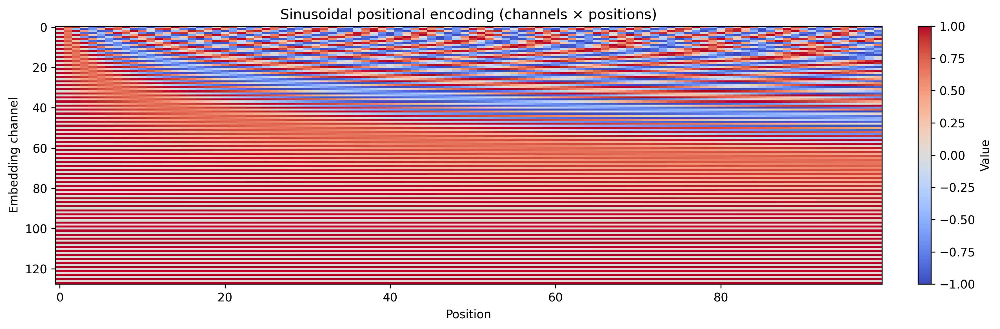

In [18]:
# Positional Encoding Heatmap
plot_pe_heatmap(model, T=L)  # only LC positions (100)

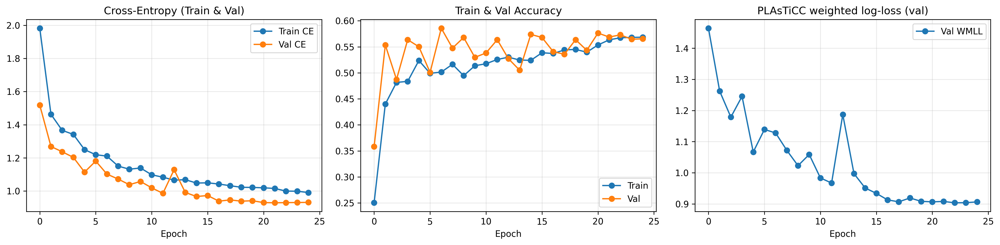

In [19]:
# Line Plot: CE (train & val), Accuracy (train & val), Val WMLL
plot_training_curves(hist)

In [20]:
sample = next(iter(DataLoader(ds_val, batch_size=1, shuffle=True)))
lc = sample["grid"][:1].to(DEVICE)      # [1,L,6]
mz = sample["meta"][:1].to(DEVICE)      # [1,11]
oid = sample["object_id"][0]

# get attention & tokens
toks, attn_list, split = get_tokens_and_attn(model, lc, mz)

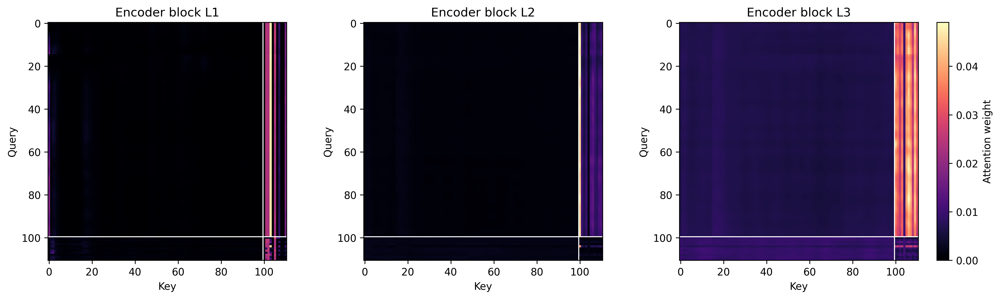

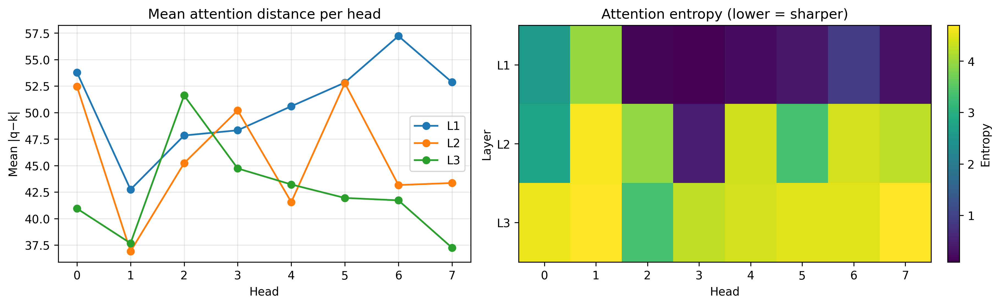

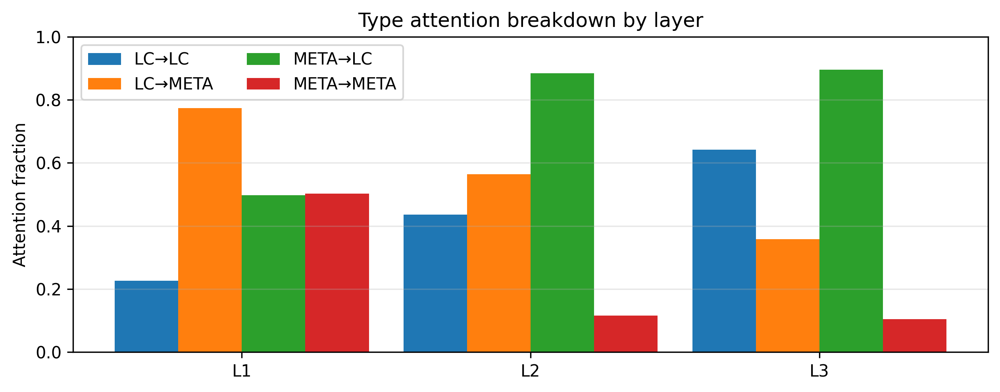

In [21]:
# Multi Head Attention plots
plot_attention_heatmaps(attn_list, split)
plot_attention_distance_and_entropy(attn_list)
plot_type_attention_breakdown(attn_list, split)

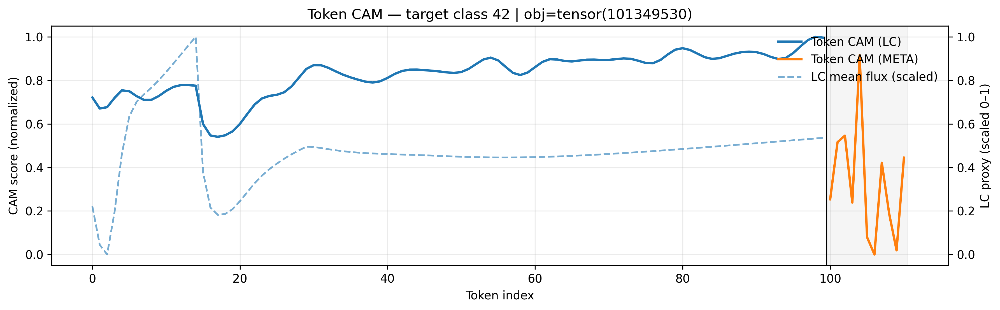

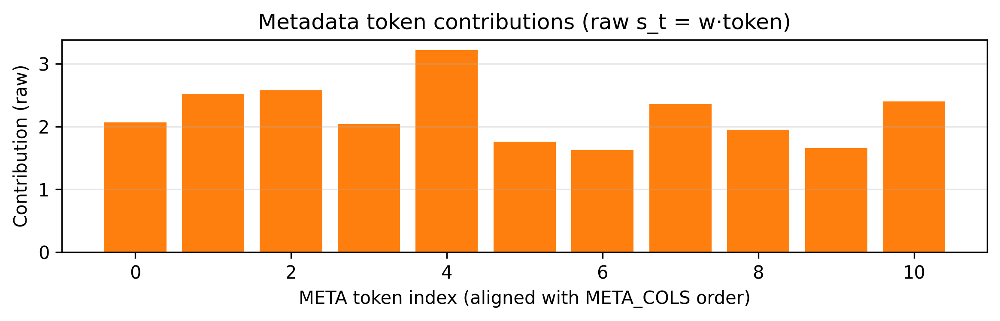

In [22]:
# CAM over tokens (predicted class by default; pass target_idx=... to force a class)
plot_token_cam(model, lc, mz, idx2id=idx2id, META_COLS=META_COLS, obj_id=oid)

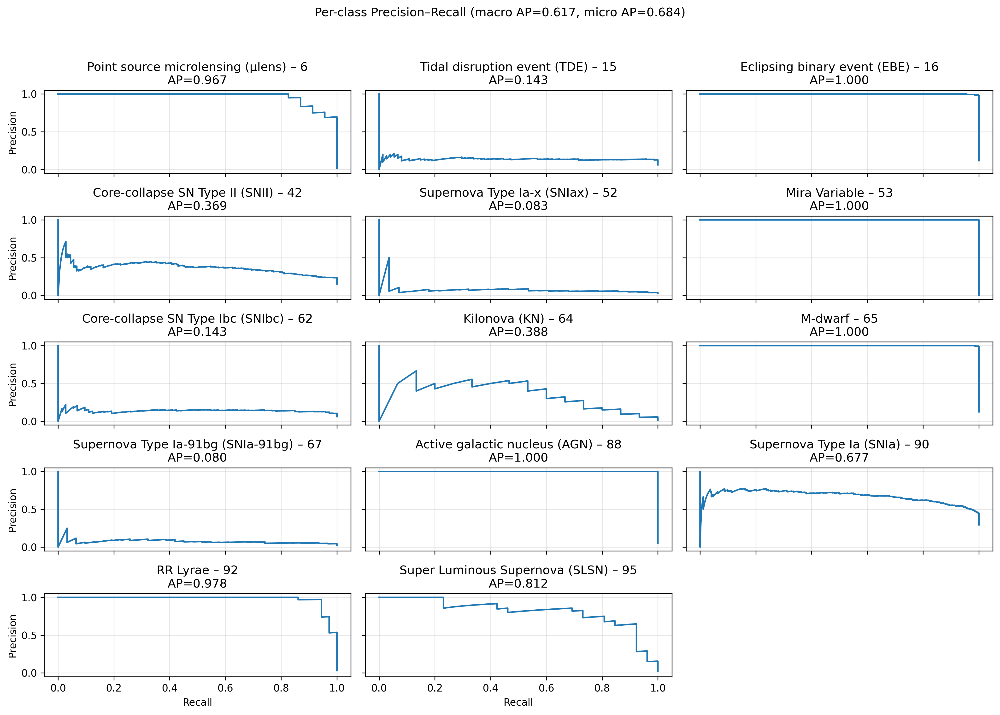

In [23]:
# Per-class PR curves

if best_state is not None:
    model.load_state_dict(best_state['model'])
probs, tgts = collect_val_probs_targets(model, val_loader, DEVICE)
plot_pr_curves_per_class(probs, tgts, class_names=IDX_LABELS, figsize=(14,10))

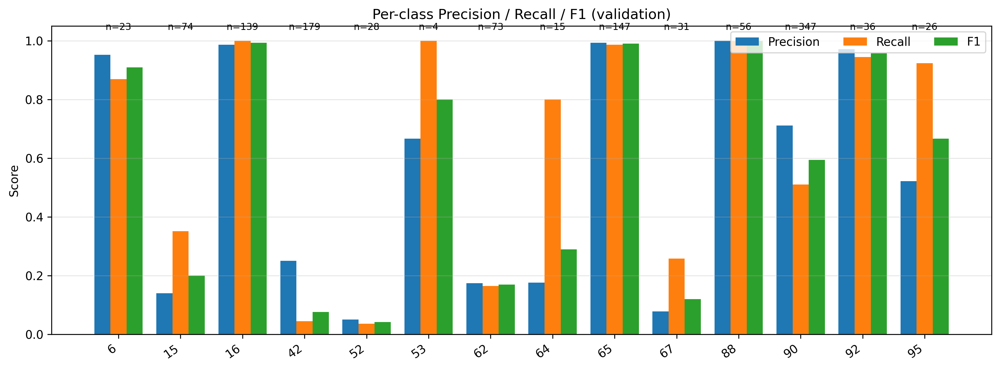

In [24]:
# Per-class F1 / Recall / Precision

preds = probs.argmax(1)
plot_f1_prec_rec_bars(tgts, preds, class_names=[str(idx2id[j]) for j in range(len(IDX_LABELS))])

[ABLAT] With META:  acc=0.565, WMLL=0.9065
[ABLAT] No  META:   acc=0.051, WMLL=8.4821
[ABLAT] Deltas:     Δacc=+0.514, ΔWMLL=-7.5755


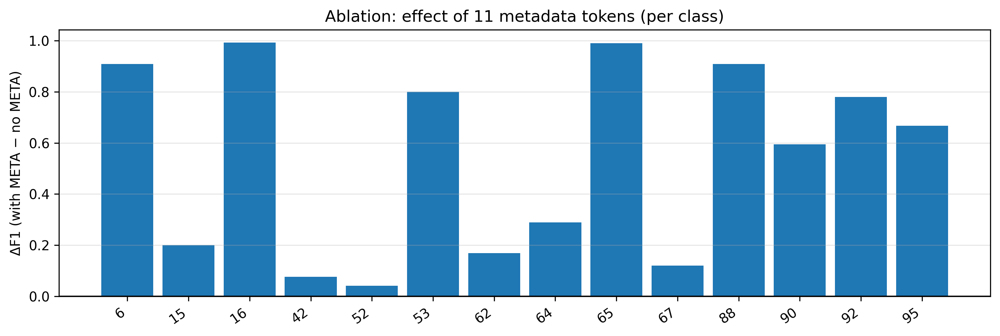

In [25]:
# Ablation bars — “with vs without metadata tokens

if best_state is not None:
    model.load_state_dict(best_state['model'])
run_meta_ablation(model, val_loader)

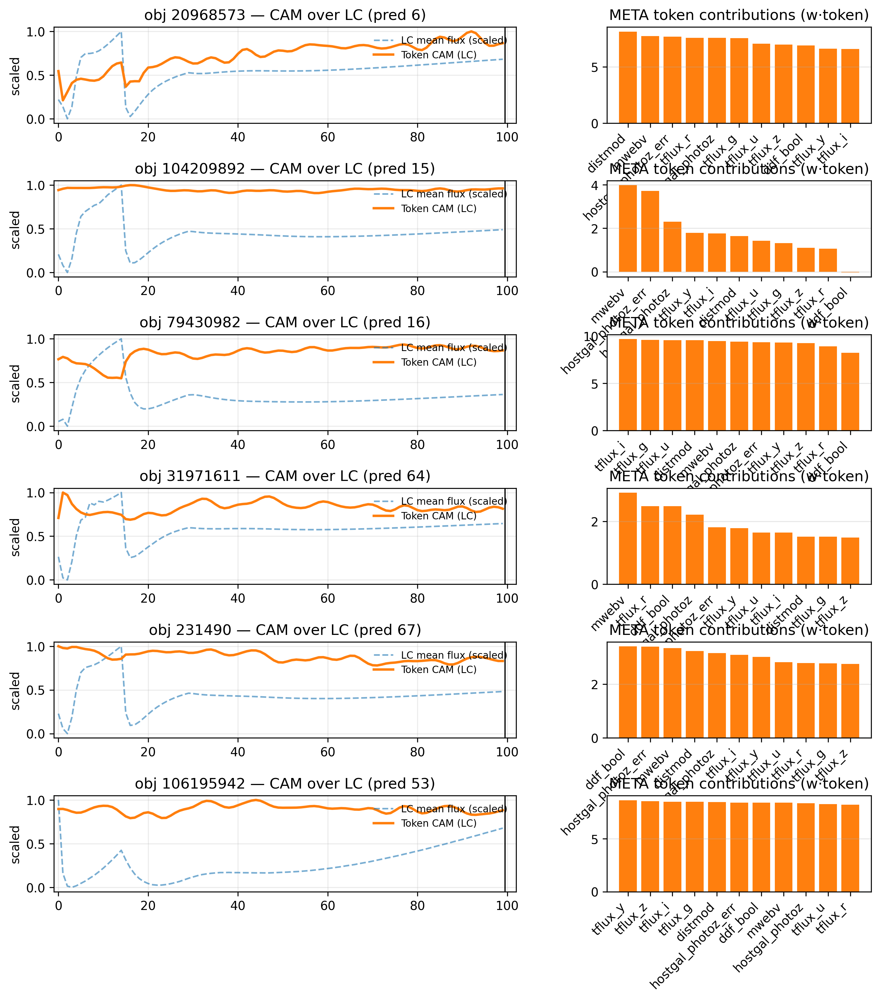

In [36]:
# Token-CAM gallery

if best_state is not None:
    model.load_state_dict(best_state['model'])
plot_token_cam_gallery(model, ds_val, idx2id, META_COLS, max_items=6)

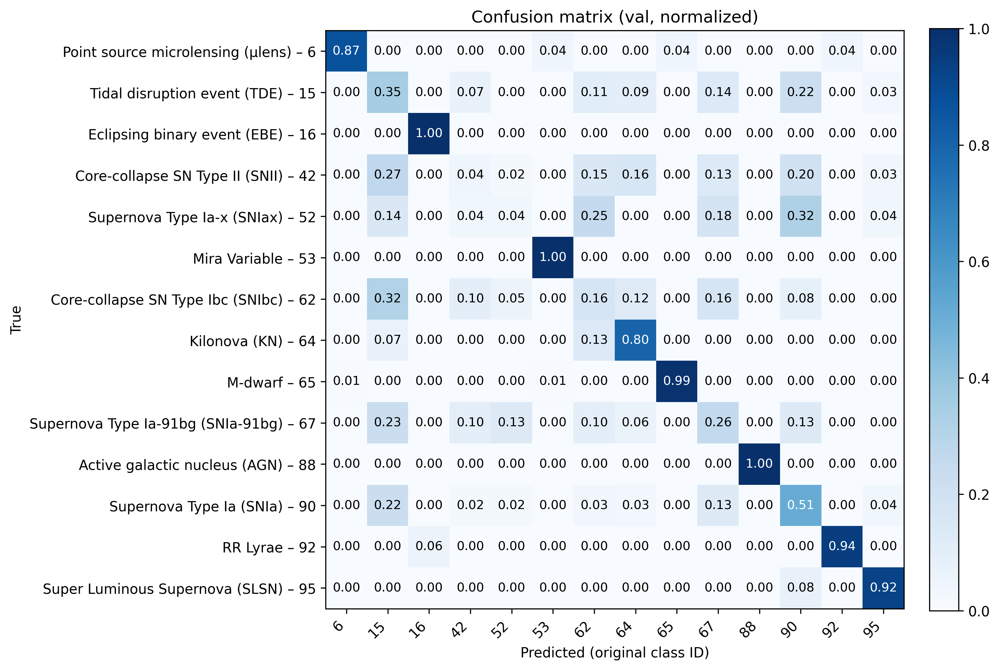

              precision    recall  f1-score   support

           0      0.952     0.870     0.909        23
           1      0.140     0.351     0.200        74
           2      0.986     1.000     0.993       139
           3      0.250     0.045     0.076       179
           4      0.050     0.036     0.042        28
           5      0.667     1.000     0.800         4
           6      0.174     0.164     0.169        73
           7      0.176     0.800     0.289        15
           8      0.993     0.986     0.990       147
           9      0.078     0.258     0.119        31
          10      1.000     1.000     1.000        56
          11      0.711     0.510     0.594       347
          12      0.971     0.944     0.958        36
          13      0.522     0.923     0.667        26

    accuracy                          0.565      1178
   macro avg      0.548     0.635     0.558      1178
weighted avg      0.622     0.565     0.570      1178



In [27]:
# Confusion matrix & report

if best_state is not None:
    model.load_state_dict(best_state['model'])
plot_confusion_and_report(model, ds_val, BATCH_VAL, DEVICE, num_classes, IDX_LABELS, idx2id)

[OK] Found 1178 cached test grids.
[OK] Test objects ready after metadata+label merge: 1178


Inference [test]: 100%|██████████| 19/19 [00:14<00:00,  1.33it/s]


[OK] Collected probs: (1178, 14)
[OK] Wrote long probs → transformer_test_probs_long.csv  (16,492 rows)
[OK] Wrote wide probs → transformer_test_probs_wide.csv  (shape (1178, 15))
[TEST] Top-1 accuracy: 0.5594
[TEST] PLAsTiCC weighted log-loss (WMLL): 1.0197


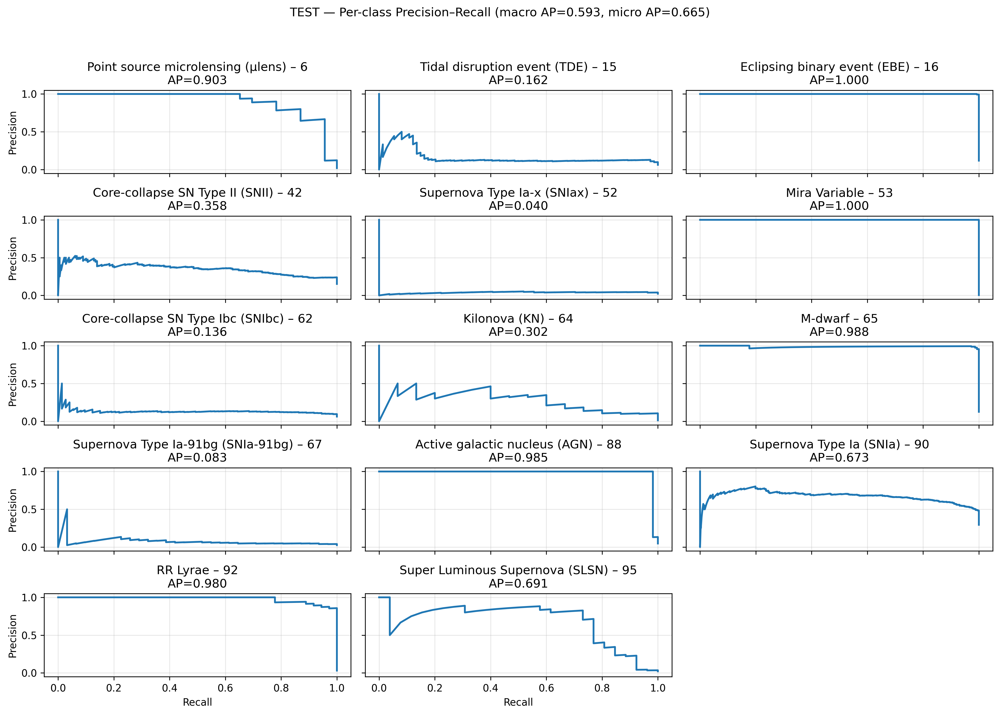

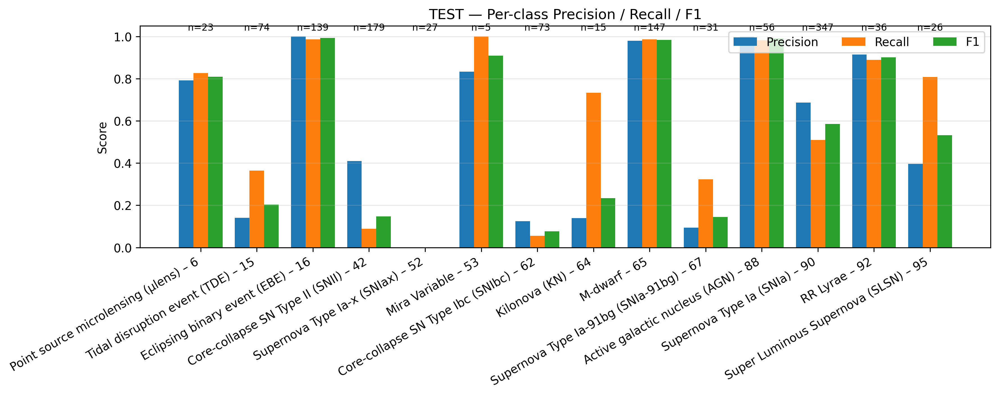

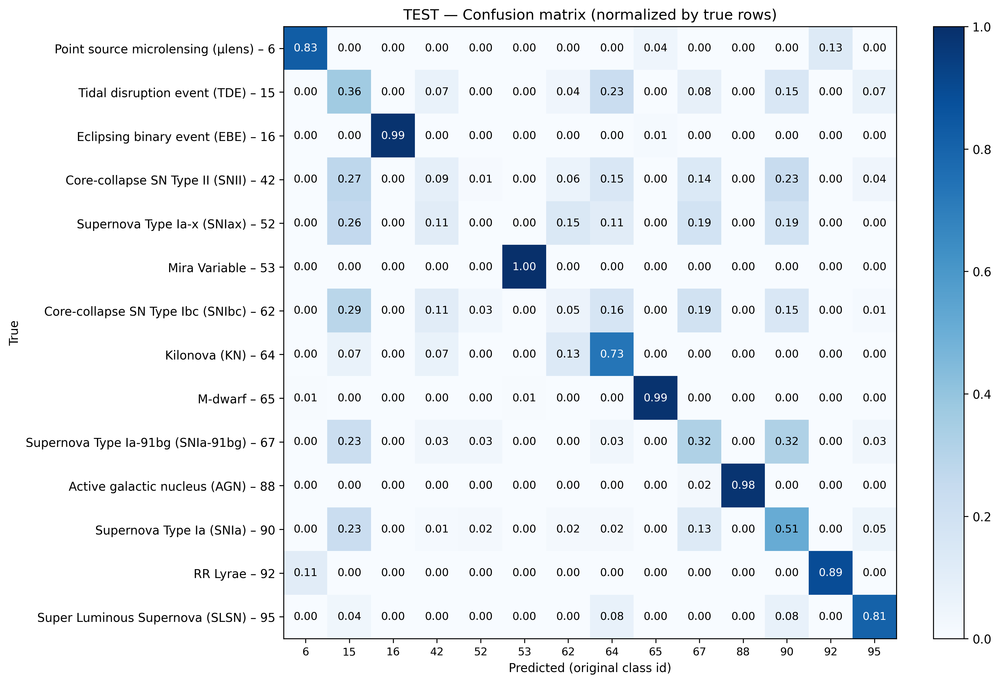

TEST — Classification report (per original class id):
              precision    recall  f1-score   support

           6      0.792     0.826     0.809        23
          15      0.141     0.365     0.203        74
          16      1.000     0.986     0.993       139
          42      0.410     0.089     0.147       179
          52      0.000     0.000     0.000        27
          53      0.833     1.000     0.909         5
          62      0.125     0.055     0.076        73
          64      0.139     0.733     0.234        15
          65      0.980     0.986     0.983       147
          67      0.093     0.323     0.145        31
          88      1.000     0.982     0.991        56
          90      0.686     0.510     0.585       347
          92      0.914     0.889     0.901        36
          95      0.396     0.808     0.532        26

    accuracy                          0.559      1178
   macro avg      0.536     0.611     0.536      1178
weighted avg      0.629   

In [28]:
# ============================================================
# Transformer TEST + EVALUATION (labels available)
#  - Uses cached SDDE grids: sdde_cache/test/*.npy  (shape [L,6])
#  - Pulls META_COLS + true_target from train_metadata for those object_ids
#  - Applies the SAME train-based z-scoring for metadata
#  - Loads best checkpoint and outputs per-class probabilities
#  - Writes submission-style csv (long and wide)
#  - EVALUATION PLOTS (TEST, LABELED SUBSET ONLY):
#       1) Per-class PR curves (macro/micro AP in title)
#       2) Per-class Precision/Recall/F1 bars
#       3) Confusion matrix heatmap (normalized rows)
#       4) Classification report
# ============================================================

import os, glob, json, random, math
import numpy as np
import pandas as pd
import matplotlib.pyplot as plt
from typing import List, Dict

import torch
from torch.utils.data import Dataset, DataLoader
from tqdm.auto import tqdm

from sklearn.metrics import (
    confusion_matrix, classification_report,
    precision_recall_curve, average_precision_score,
    precision_recall_fscore_support,
)
# -----------------------
# Assumptions / guards
# -----------------------
if 'T2Classifier' not in globals():
    raise RuntimeError("T2Classifier is not defined in this session. Please run the training cell (model definition) first.")

if 'train_metadata' not in globals():
    raise RuntimeError("Expected `train_metadata` DataFrame in memory (contains META_COLS + true_target).")

DEVICE = 'cuda' if torch.cuda.is_available() else 'cpu'
SEED = 42
random.seed(SEED); np.random.seed(SEED); torch.manual_seed(SEED)
if torch.cuda.is_available(): torch.cuda.manual_seed_all(SEED)
if hasattr(torch, "set_float32_matmul_precision"):
    torch.set_float32_matmul_precision("high")

# -----------------------
# Paths / Config  (must match training)
# -----------------------
CACHE_ROOT  = r"C:\Users\Suraj\MSc Data Science(University of Surrey)\Dissertation\PyTorch\SDDE Cache"
CACHE_TEST  = os.path.join(CACHE_ROOT, "sdde_cache", "test")  # {object_id}.npy
CHECKPOINT  = "t2_classifier_best.pth"
MAPPING_JSON= "label_mapping.json"

OUT_PROBS_CSV = "transformer_test_probs_long.csv"
OUT_WIDE_CSV  = "transformer_test_probs_wide.csv"

# Model sizes (match training)
L = 100
D_MODEL, N_HEAD, N_LAYERS, FFN_HID, DROPOUT = 128, 8, 3, 256, 0.10
BATCH_TEST = 64
PIN = (DEVICE == 'cuda')

# Metadata columns (must match training)
META_COLS = [
    'ddf_bool','hostgal_photoz','hostgal_photoz_err','distmod','mwebv',
    'tflux_u','tflux_g','tflux_r','tflux_i','tflux_z','tflux_y'
]

# Official PLAsTiCC class weights
OFFICIAL_WMLL_WEIGHTS = {
    6:2, 15:2, 16:1, 42:1, 52:1, 53:1, 62:1, 64:2, 65:1, 67:1, 88:1, 90:1, 92:1, 95:2
}

# Pretty names for plots (original class id → label)
CLASS_NAME_MAP = {
    6:  "Point source microlensing (µlens)",
    15: "Tidal disruption event (TDE)",
    16: "Eclipsing binary event (EBE)",
    42: "Core-collapse SN Type II (SNII)",
    52: "Supernova Type Ia-x (SNIax)",
    53: "Mira Variable",
    62: "Core-collapse SN Type Ibc (SNIbc)",
    64: "Kilonova (KN)",
    65: "M-dwarf",
    67: "Supernova Type Ia-91bg (SNIa-91bg)",
    88: "Active galactic nucleus (AGN)",
    90: "Supernova Type Ia (SNIa)",
    92: "RR Lyrae",
    95: "Super Luminous Supernova (SLSN)",
}

# -----------------------
# Label mapping (model-index ↔ original class id)
# -----------------------
if not os.path.exists(MAPPING_JSON):
    raise FileNotFoundError(f"Missing {MAPPING_JSON}. Re-run training to save it.")
with open(MAPPING_JSON, 'r') as f:
    m = json.load(f)
idx2id = {int(k): int(v) for k, v in m['idx2id'].items()}
id2idx = {v: k for k, v in idx2id.items()}
num_classes = len(idx2id)

# Aligned PLAsTiCC weights for evaluation
missing_w = [cid for cid in idx2id.values() if cid not in OFFICIAL_WMLL_WEIGHTS]
if missing_w:
    raise ValueError(f"Missing official WMLL weights for classes: {missing_w}")
wml_weights = np.array([OFFICIAL_WMLL_WEIGHTS[idx2id[j]] for j in range(num_classes)], dtype=np.float64)

def plasticc_weighted_logloss(y_true_idx: np.ndarray, prob: np.ndarray, class_weights: np.ndarray) -> float:
    eps = 1e-15
    prob = np.clip(prob, eps, 1.0)
    C = prob.shape[1]
    w = np.asarray(class_weights, dtype=np.float64)
    loss_per_class = np.zeros(C, dtype=np.float64)
    present = np.zeros(C, dtype=bool)
    for j in range(C):
        mask = (y_true_idx == j)
        if mask.any():
            present[j] = True
            loss_per_class[j] = -np.log(prob[mask, j]).mean()
    denom = max(w[present].sum(), 1e-12)
    return float(np.sum(w * loss_per_class) / denom)

# -----------------------
# Meta scaler (same policy as training)
# -----------------------
def fit_meta_scaler(df: pd.DataFrame, cols: List[str]) -> Dict[str, Dict[str, float]]:
    s = {}
    for c in cols:
        x = pd.to_numeric(df[c], errors='coerce').to_numpy()
        mu = float(np.nanmean(x))
        sd = float(np.nanstd(x))
        if not np.isfinite(sd) or sd == 0: sd = 1.0
        s[c] = {"mean": mu, "std": sd}
    return s

def apply_meta_scaler(df: pd.DataFrame, cols: List[str], scaler: Dict[str, Dict[str, float]]) -> pd.DataFrame:
    out = df.copy()
    for c in cols:
        x = pd.to_numeric(out[c], errors='coerce')
        out[c] = ((x - scaler[c]["mean"]) / scaler[c]["std"]).astype(np.float32)
    return out

# Train-only fill → z-score using TRAIN stats
train_medians = train_metadata[META_COLS].apply(pd.to_numeric, errors='coerce').median(numeric_only=True)
train_meta_filled = train_metadata[['object_id'] + META_COLS].copy()
for c in META_COLS:
    train_meta_filled[c] = pd.to_numeric(train_meta_filled[c], errors='coerce').fillna(train_medians[c])
meta_scaler = fit_meta_scaler(train_meta_filled, META_COLS)

# -----------------------
# List cached test grids
# -----------------------
def list_cache(cache_dir: str) -> pd.DataFrame:
    recs = []
    for p in glob.glob(os.path.join(cache_dir, "*.npy")):
        name = os.path.splitext(os.path.basename(p))[0]
        try: oid = int(name)
        except: continue
        recs.append({"object_id": oid, "path": p})
    df = pd.DataFrame(recs)
    if df.empty:
        return pd.DataFrame(columns=["object_id","path"])
    return df.sort_values("object_id").reset_index(drop=True)

man_test = list_cache(CACHE_TEST)
if len(man_test) == 0:
    raise RuntimeError(f"No .npy grids found in {CACHE_TEST}.")
print(f"[OK] Found {len(man_test)} cached test grids.")

# -----------------------
# Attach metadata + labels from train_metadata, fill + z-score
# -----------------------
need_cols = ['object_id'] + META_COLS + ['true_target']
base = train_metadata[need_cols].copy()
man_test = man_test.merge(base, on='object_id', how='left')

for c in META_COLS:
    man_test[c] = pd.to_numeric(man_test[c], errors='coerce').fillna(train_medians[c])
man_test = apply_meta_scaler(man_test, META_COLS, meta_scaler)

missing_meta = man_test[man_test[META_COLS].isna().any(axis=1)]
if len(missing_meta):
    print("[WARN] Some test objects missing metadata after merge; dropping:",
          missing_meta['object_id'].tolist()[:10], "…")
    man_test = man_test.dropna(subset=META_COLS).reset_index(drop=True)

# Check labels coverage
if 'true_target' not in man_test.columns or man_test['true_target'].isna().any():
    print("[WARN] Some test objects have no labels; supervised metrics will use the labeled subset only.")
print(f"[OK] Test objects ready after metadata+label merge: {len(man_test)}")

# -----------------------
# Test dataset / loader
# -----------------------
class TestCacheDataset(Dataset):
    def __init__(self, manifest: pd.DataFrame, seq_len: int = L):
        self.man = manifest.reset_index(drop=True)
        self.seq_len = seq_len
    def __len__(self): return len(self.man)
    def __getitem__(self, i):
        row = self.man.iloc[i]
        g = np.load(row['path'])
        if g.ndim != 2 or g.shape[1] != 6:
            raise ValueError(f"Bad grid {row['path']} (shape {g.shape}, expected [L,6])")
        out = np.zeros((self.seq_len, 6), np.float32)
        L_in = min(self.seq_len, g.shape[0])
        out[:L_in] = g[:L_in].astype(np.float32)
        meta = row[META_COLS].to_numpy(dtype=np.float32)
        y = None if pd.isna(row.get('true_target', np.nan)) else int(row['true_target'])
        return torch.from_numpy(out), torch.from_numpy(meta), int(row['object_id']), y

test_ds = TestCacheDataset(man_test, seq_len=L)
test_loader = DataLoader(test_ds, batch_size=BATCH_TEST, shuffle=False,
                         num_workers=0, pin_memory=PIN, persistent_workers=False)

# -----------------------
# Load model and infer
# -----------------------
ckpt = torch.load(CHECKPOINT, map_location='cpu')
model = T2Classifier(L=L, d_model=D_MODEL, n_layers=N_LAYERS, nhead=N_HEAD,
                     dim_ff=FFN_HID, dropout=DROPOUT, num_classes=num_classes).to(DEVICE)
model.load_state_dict(ckpt['model'])
model.eval()

all_oids, all_probs, all_true_ids = [], [], []
with torch.no_grad():
    for (x, m, oids, y) in tqdm(test_loader, desc="Inference [test]"):
        x = x.to(DEVICE, non_blocking=True)
        m = m.to(DEVICE, non_blocking=True)
        logits = model(x, m)
        probs = torch.softmax(logits, dim=1).cpu().numpy()  # [B,C]
        all_probs.append(probs)
        all_oids.extend([int(o) for o in oids])
        # collect labels if present
        y_list = [None if (t is None) else int(t) for t in y]
        all_true_ids.extend(y_list)

probs = np.concatenate(all_probs, axis=0)  # [N,C]
print(f"[OK] Collected probs: {probs.shape}")

# -----------------------
# Save outputs (long and wide)
# -----------------------
rows = []
for oid, p in zip(all_oids, probs):
    for j in range(num_classes):
        rows.append((oid, idx2id[j], float(p[j])))
out_long = pd.DataFrame(rows, columns=['object_id','class_id','prob']).sort_values(['object_id','class_id'])
out_long.to_csv(OUT_PROBS_CSV, index=False)
print(f"[OK] Wrote long probs → {OUT_PROBS_CSV}  ({len(out_long):,} rows)")

wide_cols = ['object_id'] + [str(idx2id[j]) for j in range(num_classes)]
wide = pd.DataFrame({'object_id': all_oids})
for j in range(num_classes):
    wide[str(idx2id[j])] = probs[:, j]
wide = wide.groupby('object_id', as_index=False).mean().sort_values('object_id')
wide = wide[wide_cols]
wide.to_csv(OUT_WIDE_CSV, index=False)
print(f"[OK] Wrote wide probs → {OUT_WIDE_CSV}  (shape {wide.shape})")

# -----------------------
# Supervised metrics & plots (use labeled subset only)
# -----------------------
mask_labeled = [t is not None for t in all_true_ids]
if any(mask_labeled):
    y_true_ids = np.array([t for t in all_true_ids if t is not None], dtype=int)
    sel_idx    = np.flatnonzero(mask_labeled)
    probs_sel  = probs[sel_idx]

    # Convert true labels to model index space
    y_true_idx = np.array([id2idx[cid] for cid in y_true_ids], dtype=int)

    # Top-1 accuracy & WMLL (numbers only — optional print)
    top1 = (probs_sel.argmax(axis=1) == y_true_idx).mean()
    wml  = plasticc_weighted_logloss(y_true_idx, probs_sel, class_weights=wml_weights)
    print(f"[TEST] Top-1 accuracy: {top1:.4f}")
    print(f"[TEST] PLAsTiCC weighted log-loss (WMLL): {wml:.4f}")

    # ========= EVALUATION PLOTS (ONLY THE FOUR REQUESTED) =========

    # 1) Per-class PR curves (macro & micro AP in title)
    def plot_test_pr_curves(probs_sel, y_true_idx, idx2id, class_name_map=None, figsize=(14,10), ncols=3):
        C = probs_sel.shape[1]
        Y = np.eye(C)[y_true_idx]

        ap = []
        pre, rec = {}, {}
        for j in range(C):
            pre[j], rec[j], _ = precision_recall_curve(Y[:, j], probs_sel[:, j])
            ap.append(average_precision_score(Y[:, j], probs_sel[:, j]))

        # micro & macro AP
        pre_mi, rec_mi, _ = precision_recall_curve(Y.ravel(), probs_sel.ravel())
        ap_mi = average_precision_score(Y, probs_sel, average='micro')
        ap_ma = average_precision_score(Y, probs_sel, average='macro')

        nrows = int(np.ceil(C / ncols))
        fig, axes = plt.subplots(nrows, ncols, figsize=figsize, sharex=True, sharey=True)
        axes = np.array(axes).reshape(nrows, ncols)

        for j in range(C):
            r, c = divmod(j, ncols)
            cls_id = idx2id[j]
            name = f"{class_name_map.get(cls_id, str(cls_id))} – {cls_id}" if class_name_map else str(cls_id)
            axes[r, c].plot(rec[j], pre[j], lw=1.8)
            axes[r, c].set_title(f"{name}\nAP={ap[j]:.3f}")
            axes[r, c].grid(True, alpha=0.3)

        for k in range(C, nrows*ncols):
            r, c = divmod(k, ncols)
            axes[r, c].axis('off')

        fig.suptitle(f"TEST — Per-class Precision–Recall (macro AP={ap_ma:.3f}, micro AP={ap_mi:.3f})", y=0.99)
        for ax in axes[-1]: ax.set_xlabel("Recall")
        for ax in axes[:,0]: ax.set_ylabel("Precision")
        plt.tight_layout(rect=[0,0,1,0.96]); plt.show()

    # 2) Per-class Precision / Recall / F1 bars
    def plot_test_f1_prec_rec_bars(y_true_idx, probs_sel, idx2id, class_name_map=None, figsize=(12,4.8)):
        preds = probs_sel.argmax(1)
        P, R, F1, support = precision_recall_fscore_support(
            y_true_idx, preds, labels=np.arange(probs_sel.shape[1]), zero_division=0
        )
        x = np.arange(len(F1))
        w = 0.26
        fig, ax = plt.subplots(figsize=figsize)
        ax.bar(x - w, P, width=w, label="Precision")
        ax.bar(x,     R, width=w, label="Recall")
        ax.bar(x + w, F1, width=w, label="F1")

        ax.set_ylim(0, 1.05)
        xt = []
        for j in range(len(F1)):
            cls_id = idx2id[j]
            label = f"{class_name_map.get(cls_id, str(cls_id))} – {cls_id}" if class_name_map else str(cls_id)
            xt.append(label)
        ax.set_xticks(x)
        ax.set_xticklabels(xt, rotation=30, ha='right')

        for i, s in enumerate(support):
            ax.text(i, 1.02, f"n={int(s)}", ha='center', va='bottom', fontsize=8)

        ax.set_title("TEST — Per-class Precision / Recall / F1")
        ax.set_ylabel("Score")
        ax.grid(True, axis='y', alpha=.3)
        ax.legend(ncol=3)
        plt.tight_layout(); plt.show()

    # 3) Confusion matrix heatmap (normalized rows)
    def plot_test_confusion_heatmap(y_true_idx, probs_sel, idx2id, class_name_map=None):
        cm = confusion_matrix(y_true_idx, probs_sel.argmax(axis=1),
                              labels=list(range(probs_sel.shape[1])))
        row_sums = cm.sum(axis=1, keepdims=True).clip(min=1)
        cm_norm = cm / row_sums

        ytick = []
        xtick = []
        for j in range(probs_sel.shape[1]):
            cid = idx2id[j]
            ytick.append(f"{class_name_map.get(cid, str(cid))} – {cid}" if class_name_map else str(cid))
            xtick.append(str(cid))

        plt.figure(figsize=(12,8))
        im = plt.imshow(cm_norm, cmap='Blues', vmin=0.0, vmax=1.0)
        plt.colorbar(im, fraction=0.046, pad=0.04)
        for i in range(cm_norm.shape[0]):
            for j in range(cm_norm.shape[1]):
                val = cm_norm[i, j]
                plt.text(j, i, f"{val:.2f}", ha='center', va='center',
                         fontsize=9, color=('black' if val < 0.6 else 'white'))
        plt.yticks(range(len(ytick)), ytick, fontsize=10)
        plt.xticks(range(len(xtick)), xtick, fontsize=9, rotation=0)
        plt.xlabel("Predicted (original class id)")
        plt.ylabel("True")
        plt.title("TEST — Confusion matrix (normalized by true rows)")
        plt.tight_layout(); plt.show()

    # 4) Classification report (printed)
    def print_test_classification_report(y_true_idx, probs_sel, idx2id):
        preds = probs_sel.argmax(1)
        target_names = [str(idx2id[i]) for i in range(probs_sel.shape[1])]
        print("TEST — Classification report (per original class id):")
        print(classification_report(y_true_idx, preds, digits=3, target_names=target_names))

    # ---- Call the four plots/reports
    plot_test_pr_curves(
        probs_sel=probs_sel,
        y_true_idx=y_true_idx,
        idx2id=idx2id,
        class_name_map=CLASS_NAME_MAP
    )
    plot_test_f1_prec_rec_bars(
        y_true_idx=y_true_idx,
        probs_sel=probs_sel,
        idx2id=idx2id,
        class_name_map=CLASS_NAME_MAP
    )
    plot_test_confusion_heatmap(
        y_true_idx=y_true_idx,
        probs_sel=probs_sel,
        idx2id=idx2id,
        class_name_map=CLASS_NAME_MAP
    )
    print_test_classification_report(
        y_true_idx=y_true_idx,
        probs_sel=probs_sel,
        idx2id=idx2id
    )

else:
    print("[INFO] No labels found after merge; supervised metrics/plots skipped.")